# Plots of multiple 2forms 

In this notebook we show how to integrate $2$- forms in $\mathbb{R}^n$ over the $2$-simplices of a complex and use this method to classify surfaces in $\mathbb{R}^3$

In [38]:
import numpy as np
import matplotlib as mpl
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
from matplotlib import colors as mcolors
import gudhi as gd 
import scipy.special

import pickle

from sklearn.decomposition import PCA
import pandas as pd

import k_forms as kf
import k_forms_visual as vis   

import torch.optim as optim
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.tri as mtri
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1. loading the synthetic data set of surfaces 

The random surfaces in this notebook are created by embedding a triangulation of the unit square $[0,1]\times [0,1]$ in $\mathbb{R}^3$. 
We subdivide the interval $[0,1]$ in <code>num_pts</code> points to obtain a grid of vertices in the unit square and take the alpha complex of those vertices.

The 2-simplices are:  [[0, 1, 7], [1, 2, 8], [1, 7, 8], [2, 3, 9], [2, 8, 9], [3, 4, 10], [3, 9, 10], [4, 5, 11], [4, 10, 11], [5, 6, 12], [5, 11, 12], [6, 12, 13], [7, 8, 14], [8, 9, 15], [8, 14, 15], [9, 10, 16], [9, 15, 16], [10, 11, 17], [10, 16, 17], [11, 12, 18], [11, 17, 18], [12, 13, 19], [12, 18, 19], [13, 19, 20], [14, 15, 21], [15, 16, 22], [15, 21, 22], [16, 17, 23], [16, 22, 23], [17, 18, 24], [17, 23, 24], [18, 19, 25], [18, 24, 25], [19, 20, 26], [19, 25, 26], [20, 26, 27], [21, 22, 28], [22, 23, 29], [22, 28, 29], [23, 24, 30], [23, 29, 30], [24, 25, 31], [24, 30, 31], [25, 26, 32], [25, 31, 32], [26, 27, 33], [26, 32, 33], [27, 33, 34], [28, 29, 35], [29, 30, 36], [29, 35, 36], [30, 31, 37], [30, 36, 37], [31, 32, 38], [31, 37, 38], [32, 33, 39], [32, 38, 39], [33, 34, 40], [33, 39, 40], [34, 40, 41], [35, 36, 42], [36, 37, 43], [36, 42, 43], [37, 38, 44], [37, 43, 44], [38, 39, 45], [38, 44, 45], [39, 40, 46], [39, 45, 46], [40, 41, 47], [40, 46, 47], [41, 47, 48]]
Th

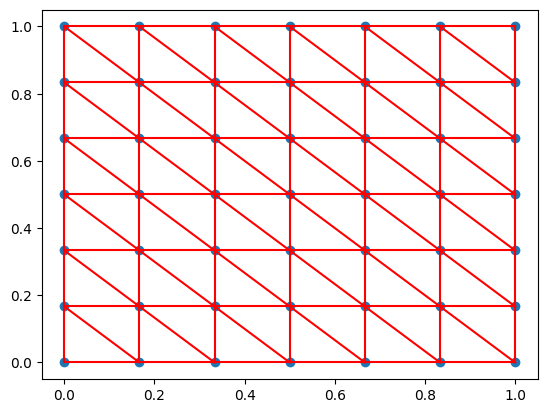

In [25]:
num_pts = 7 ##number of points to subddivide the intverval [0,1] into 
## Precomputed things 
num_sub = 2 ## how many times we subdivide each triangle for integration 
subdivision_vert, subdivision_coefs = kf.subdivide_simplex_coef_torch(num_sub)
k = 2 
dim = 3 
classes = 2

N = int(scipy.special.binom(dim,k))

det = kf.build_determinant_tensor(dim, k) ## will be needed for integration

# create and plot an alpha-complex on the unit square 
points, ac = kf.plot_unit_square_grid(num_pts)

simplices = [] #list of 2-simplices 
for s in ac.get_skeleton(2):
    if len(s[0]) == 3: 
        simplices.append(s[0])

edges = [] #list of 1-simplices
for s in ac.get_skeleton(2):
    if len(s[0]) == 2: 
        edges.append(s[0])

print("The 2-simplices are: ", simplices)
print("There are ", len(simplices), " 2-simplices")

In [26]:
try_num = 5
filename = 'sine_functions/multiple_cochains_try'+str(try_num)

# load the files
with open('kforms/'+filename+'_losses.pkl', 'rb') as f:
    Losses  = pickle.load(f)

# dump accuracies into a pickle file
with open('kforms/'+filename+'_accuracies.pkl', 'rb') as f:
    Accuracies = pickle.load(f) 

# save the surfaces
with open('kforms/'+filename+'_surfaces.pkl', 'rb') as f:
    surfaces_list = pickle.load(f)

with open('kforms/'+filename+'_cochains.pkl', 'rb') as f:
    cochains = pickle.load( f)

num_surf = int(len(surfaces_list)/2)
labels = np.concatenate((np.zeros(num_surf),np.ones(num_surf)))


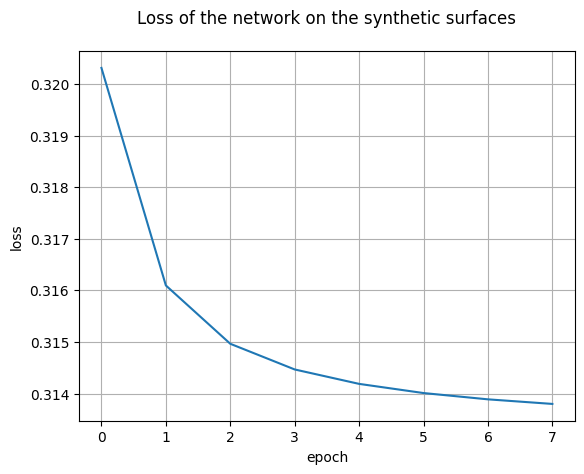

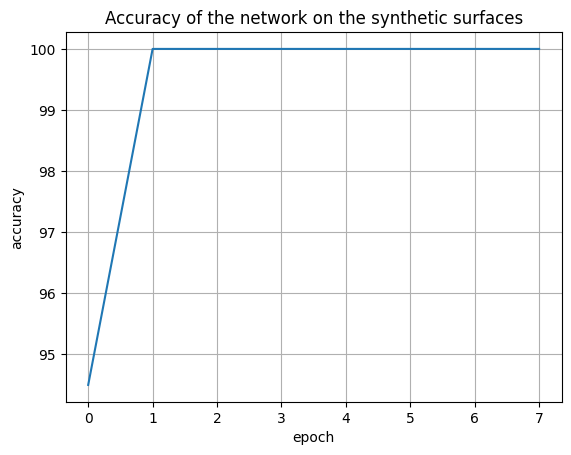

In [27]:
# plot the loss
fig, ax = plt.subplots()
ax.plot(np.arange(len(Losses)), Losses)
ax.set(xlabel='epoch', ylabel='loss')
ax.set_title('Loss of the network on the synthetic surfaces', pad = 20)

# add more space between the plot and the title
ax.grid()
plt.savefig('figures/synthetic-surfaces/loss.pdf')
plt.show()

# plot the accuracy
fig, ax = plt.subplots()
ax.plot(np.arange(len(Accuracies)), Accuracies)
ax.set(xlabel='epoch', ylabel='accuracy', title='Accuracy of the network on the synthetic surfaces'.format(num_surf*2))
ax.grid()
plt.savefig('figures/synthetic-surfaces/accuracy.pdf')
plt.show()

In [73]:
cochain0 = [cochains[i][:,0] for i in range(len(cochains))]
cochain1 = [cochains[i][:,1] for i in range(len(cochains))]


representation = np.zeros((200, 2))
for i in range(200):
    representation[i,0] = np.sum(cochain0[i])
    representation[i,1] = np.sum(cochain1[i])


In [75]:
for k in range(50):
    print(representation[k,:])

for k in range(100,150):
    print(representation[k,:])


[ 4.60882759 -4.13103962]
[ 4.63549232 -3.97011614]
[ 4.88931084 -4.25614977]
[ 5.26822233 -5.01032925]
[ 5.54715061 -5.24151278]
[ 4.86506271 -4.2072525 ]
[ 3.71647501 -3.93489599]
[ 4.73861217 -4.32005024]
[ 4.61165428 -3.99025869]
[ 3.76789451 -4.02876186]
[ 4.57112789 -4.52735996]
[ 4.59861231 -4.61050749]
[ 4.73346376 -4.65061188]
[ 4.57755709 -4.35250998]
[ 3.57831788 -3.74035287]
[ 4.54615068 -4.05199289]
[ 3.6832552  -3.91473889]
[ 4.72945738 -4.1151371 ]
[ 4.62702608 -4.25311947]
[ 4.82480049 -4.57065868]
[ 3.66565132 -3.86668348]
[ 4.2206521  -3.73350596]
[ 5.06882763 -4.92883396]
[ 3.89147139 -3.76569891]
[ 4.71480465 -4.28807783]
[ 3.53339267 -4.15577221]
[ 3.6269145  -4.06048012]
[ 4.40106583 -4.89795351]
[ 4.16577148 -4.52071285]
[ 4.14901638 -3.78813529]
[ 4.77597523 -4.52087212]
[ 4.35100269 -3.95936584]
[ 3.85939121 -4.07195616]
[ 2.87276006 -3.06443262]
[ 3.82231021 -4.21297693]
[ 5.17891502 -4.74138641]
[ 4.82023335 -4.53357697]
[ 3.85487962 -4.33615541]
[ 4.74596214

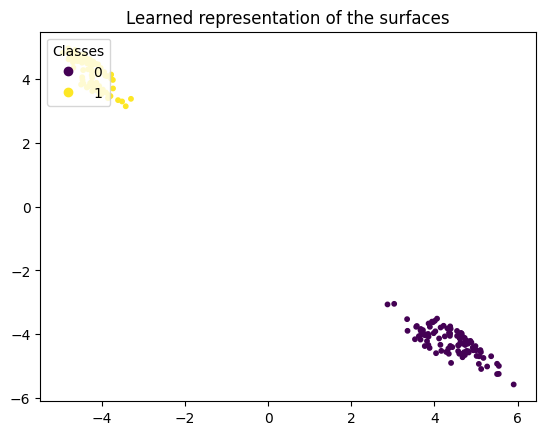

In [29]:

representation = np.zeros((200, 2))
for i in range(200):
    representation[i,0] = np.sum(cochain0[i])
    representation[i,1] = np.sum(cochain1[i])

# plot the representation

fig, ax = plt.subplots()

scatter = ax.scatter(representation[:,0], representation[:,1], s = 10, c=labels, cmap='viridis')

# plot legend
legend1 = ax.legend(*scatter.legend_elements(), loc="upper left", title="Classes")


ax.set_title('Learned representation of the surfaces')
plt.savefig('figures/synthetic-surfaces/learned_representation.pdf')
plt.show()

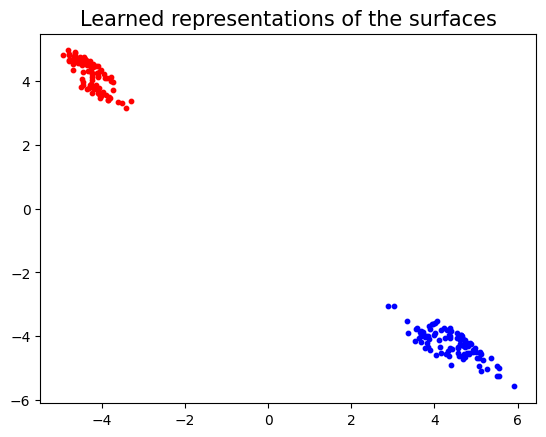

In [30]:


# plot the representation

fig, ax = plt.subplots()

for i in range(100): 
    ax.scatter(representation[i,0], representation[i,1], s = 10, c='blue')
for i in range(100,200):
    ax.scatter(representation[i,0], representation[i,1], s = 10, c='red')

ax.set_title('Learned representations of the surfaces', size = 15)
plt.savefig('figures/synthetic-surfaces/learned_representation.pdf')
plt.show()

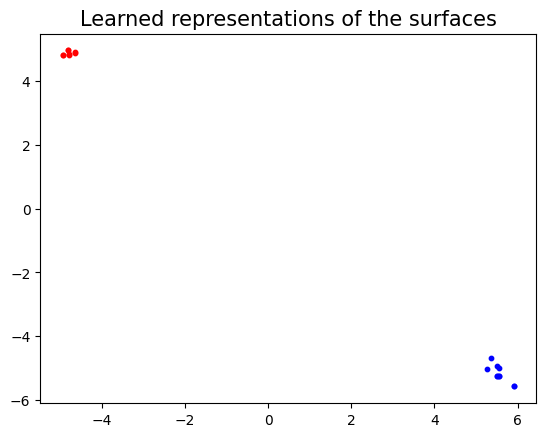

In [31]:


# plot the representation

fig, ax = plt.subplots()

class0cochain0 = []
class0cochain1 = []
class1cochain0 = []
class1cochain1 = []


for i in range(100): 
    if representation[i,0] > 5.2:
        class0cochain0.append(i)
        ax.scatter(representation[i,0], representation[i,1], s = 10, c='blue')
    if representation[i,1] < -5.2:
        class0cochain1.append(i)
        ax.scatter(representation[i,0], representation[i,1], s = 10, c='blue')
        
for i in range(100,200):
    if representation[i,0] < -4.8:
        class1cochain0.append(i)
        ax.scatter(representation[i,0], representation[i,1], s = 10, c='red')
    if representation[i,1] > 4.8:
        class1cochain1.append(i)
        ax.scatter(representation[i,0], representation[i,1], s = 10, c='red')
ax.set_title('Learned representations of the surfaces', size = 15)
#plt.savefig('figures/synthetic-surfaces/learned_representation.pdf')
plt.show()

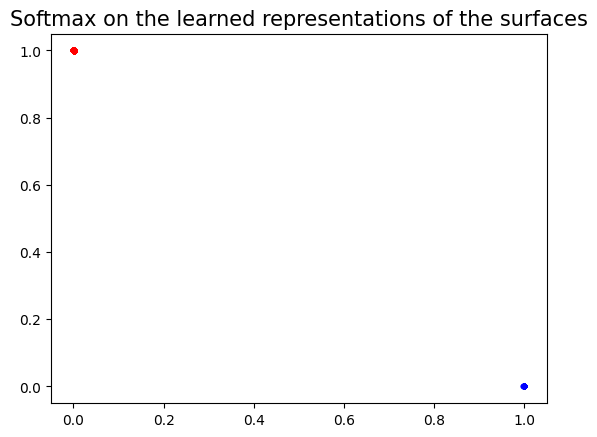

In [32]:
# apply softmax to the representation of each surface

softmax = nn.Softmax(dim=1)


fig, ax = plt.subplots()

for i in range(100): 
    rep_soft = softmax(torch.tensor(representation[i]).reshape(1,2)).detach().numpy()[0]
    ax.scatter(rep_soft[0], rep_soft[1], s = 10, c='blue')
for i in range(100,200):
    rep_soft = softmax(torch.tensor(representation[i]).reshape(1,2)).detach().numpy()[0]
    ax.scatter(rep_soft[0], rep_soft[1], s = 10, c='red')

ax.set_title('Softmax on the learned representations of the surfaces', size = 15)
#plt.savefig('figures/synthetic-surfaces/learned_representation.pdf')
plt.show()


In [33]:
print(class0cochain0)
print(class0cochain1)
print(class1cochain0)
print(class1cochain1)


[3, 4, 53, 59, 62, 74, 98]
[4, 53, 74]
[162, 174]
[123, 126, 162, 165, 168, 174]


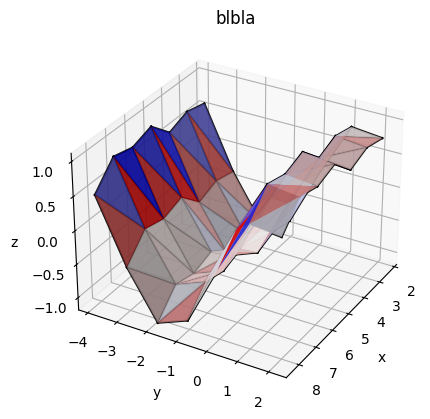

In [39]:
k = 159
surface = surfaces_list[k]
color = vis.value2color(cochains[k][:,0])
view = (30,30)
vis.plot_surface_cochain(surface, color, simplices, edges, title = 'blbla', view = view)
#plt.savefig('figures/synthetic-surfaces/surface_cochain.pdf')

## Plot the first cochain on the surfaces 

In [40]:
cochain_np= np.array(cochain0)
print(cochain_np.shape)
cochain_np = cochain_np.flatten()
print(cochain_np.shape)
min_val = cochain_np.min()
max_val = cochain_np.max()

(200, 72)
(14400,)


5.2682223
5.5471506
5.906169
5.364642
5.550029
5.507426
5.5071173
-------------------
-4.935205
-4.8057184


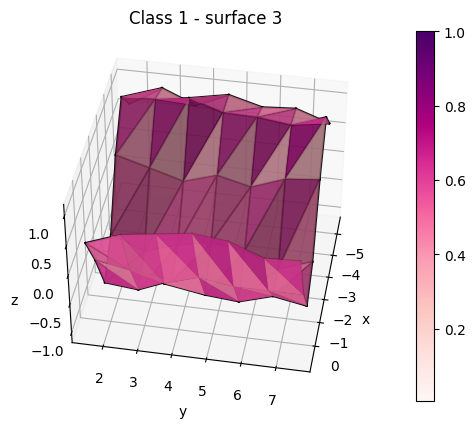

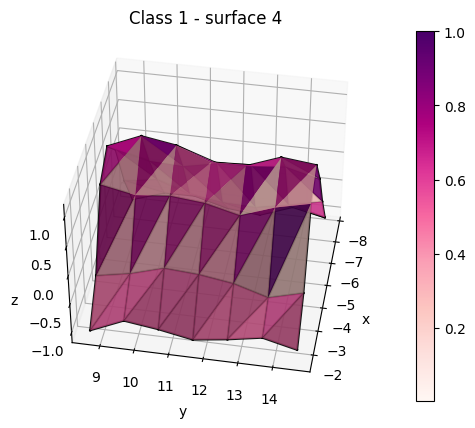

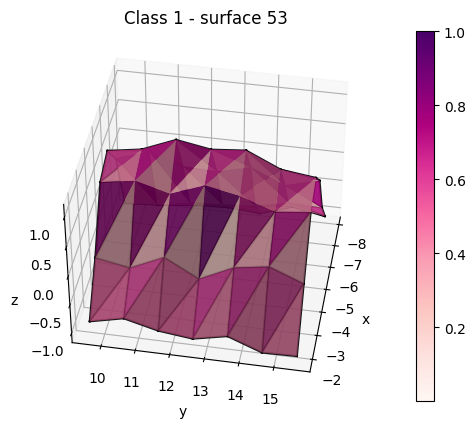

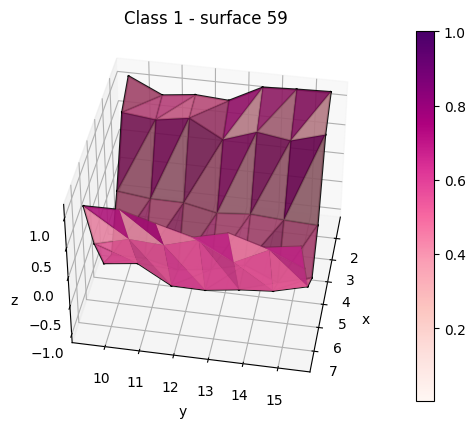

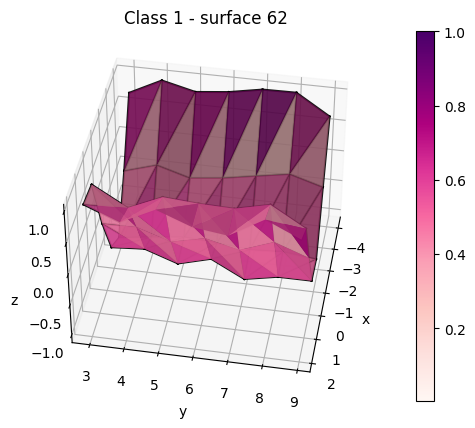

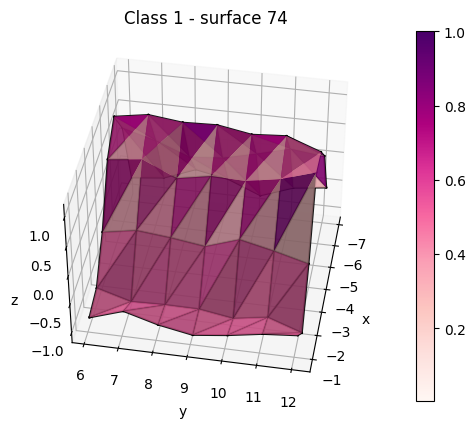

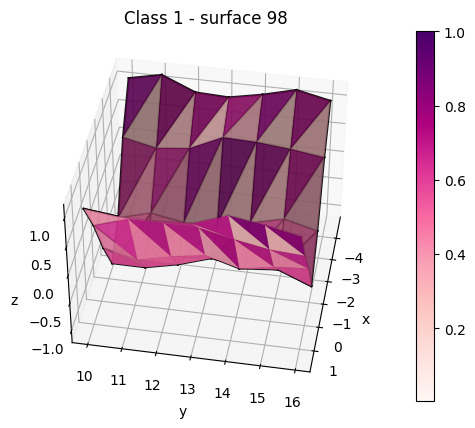

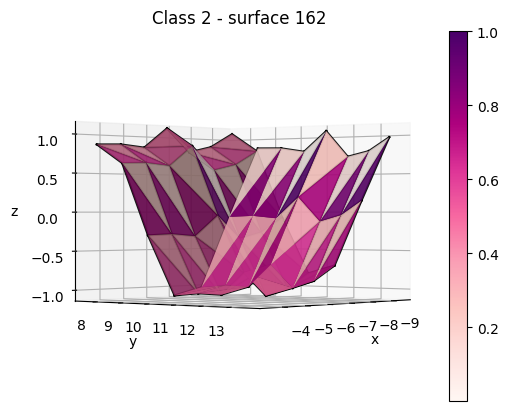

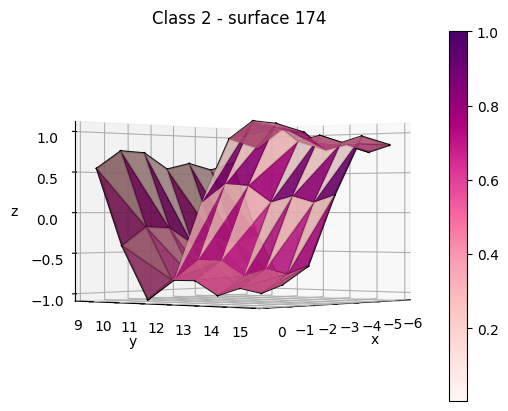

In [59]:
import k_forms_visual as vis
cochain_np= np.array(cochain0)
cochain_np = cochain_np.flatten()
min_val = cochain_np.min()
max_val = cochain_np.max()

view = (40,10)
for k in class0cochain0:
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain0[k], min_val, max_val)
    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)
    print(np.sum(cochain0[k]))
print('-------------------')
view = (0,40)
for k in class1cochain0: 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain0[k], min_val, max_val)

    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 2 - surface '+str(k), view = view)
    #plt.savefig('figures/synthetic-surfaces/surface_cochain'+str(k)+'.pdf')
    print(np.sum(cochain0[k]))

-1.9229093
2.1550624
-5.241513
-5.573464
-5.246992
-------------------
4.8649874
4.850665
4.8208537
4.831794
4.9106994
4.9578905


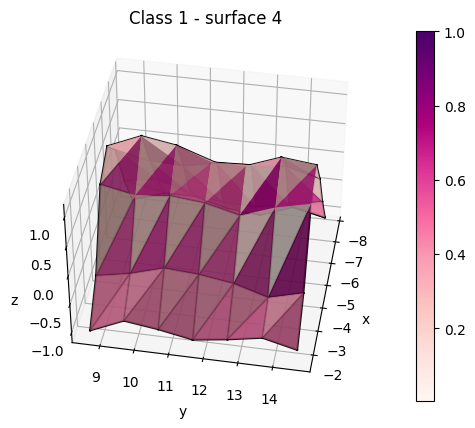

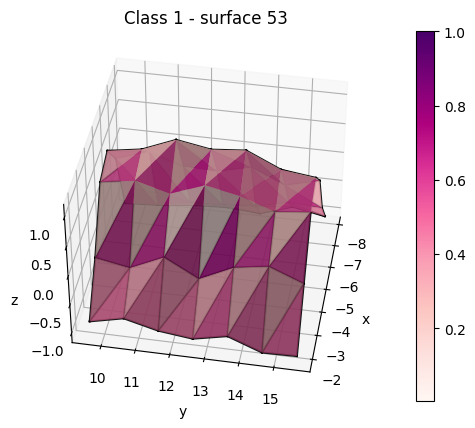

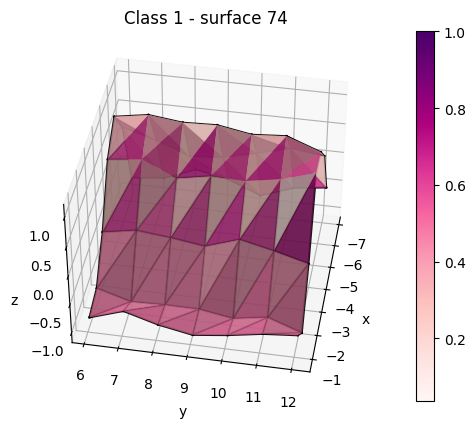

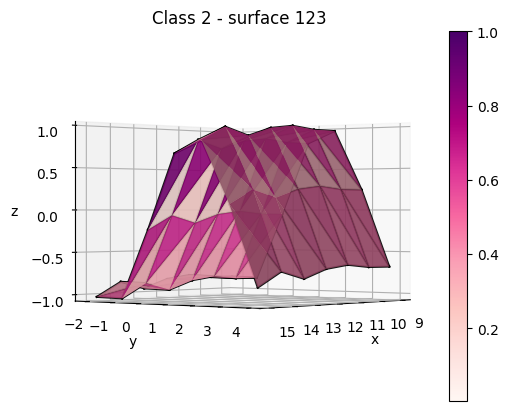

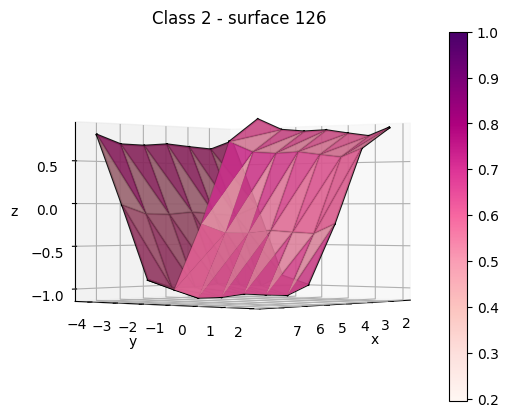

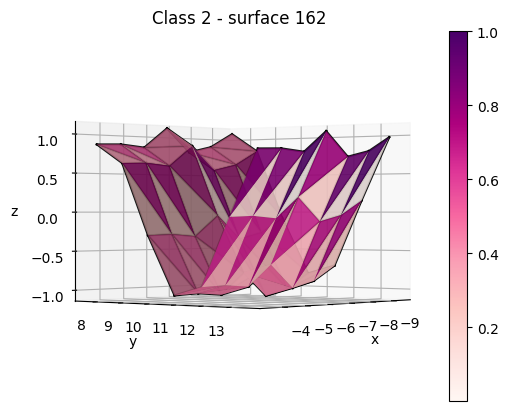

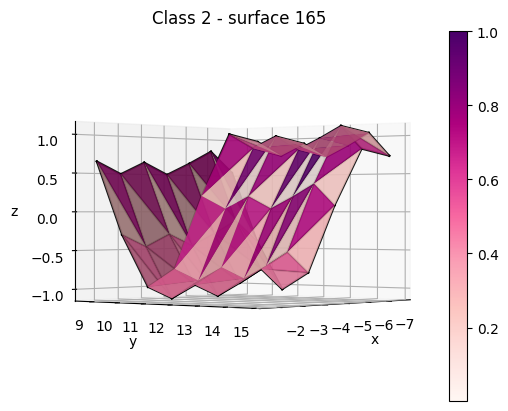

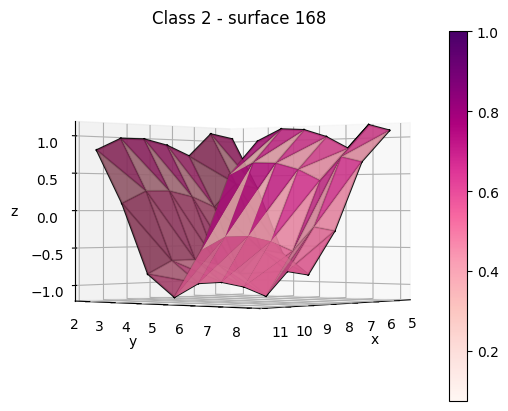

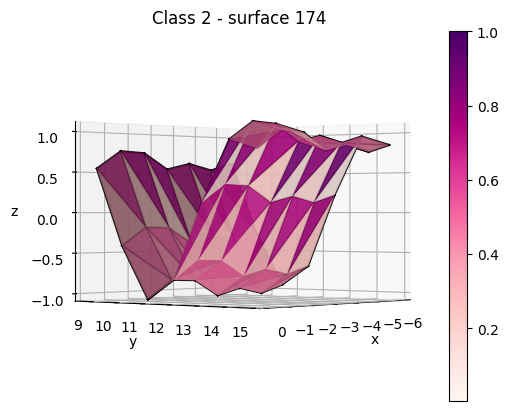

In [60]:
cochain_np= np.array(cochain1)
cochain_np = cochain_np.flatten()
min_val = cochain_np.min()
max_val = cochain_np.max()
print(min_val)
print(max_val)



view = (40,10)
for k in class0cochain1:
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain1[k], min_val, max_val)
    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)
    print(np.sum(cochain1[k]))
    
print('-------------------')    

view = (0,40)
for k in class1cochain1: 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain1[k], min_val, max_val)
    print(np.sum(cochain1[k]))

    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 2 - surface '+str(k), view = view)
    #plt.savefig('figures/synthetic-surfaces/surface_cochain'+str(k)+'.pdf')

In [93]:
def plot_surface_integral(surface, color, simplices, edges, title = None, view = None): 

    sx = surface['points'][:,0].reshape(7,7)
    sy = surface['points'][:,1].reshape(7,7)
    sz = surface['points'][:,2].reshape(7,7)

    # plot the surface
    fig = plt.figure()
    ax = fig.gca(projection='3d')

    for i in range(len(simplices)): 
        simplex = simplices[i]
        pts = surface['points'][simplex]
        x = pts[:,0]
        y = pts[:,1]
        z = pts[:,2]

        tri = mtri.Triangulation(x, y)
        ax.plot_trisurf(x, y, z, triangles=tri.triangles, color =color, alpha = 0.9)

    
    for e in edges: 
        pts = surface['points'][e]
        pt1 = np.array(pts[0])
        pt2 = np.array(pts[1])
        # plot the edge from the points
        ax.plot([pt1[0], pt2[0]], [pt1[1], pt2[1]], [pt1[2], pt2[2]], 'k', alpha = 0.9)

    # add the colorbar
    #norm = mpl.colors.Normalize(vmin=color.min(), vmax=color.max())
    #sm = plt.cm.ScalarMappable(cmap=mpl.cm.bwr)
    #sm.set_array([])
    #fig.colorbar(sm)

    
    # set axis labels
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')


    if view is not None: 
        ax.view_init(view[0], view[1])
    else:
        ax.view_init(60,10)

    if title is not None: 
        ax.set_title(title)
    else: 
        ax.set_title('Surface plot')
   

    

/Users/celiahacker/opt/anaconda3/envs/celia/lib/python3.7/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  if __name__ == "__main__":


-5.246992


/Users/celiahacker/opt/anaconda3/envs/celia/lib/python3.7/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  if __name__ == "__main__":


4.8649874


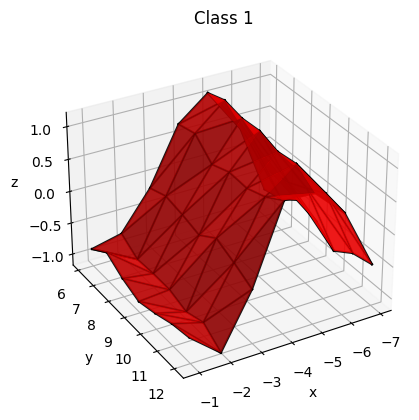

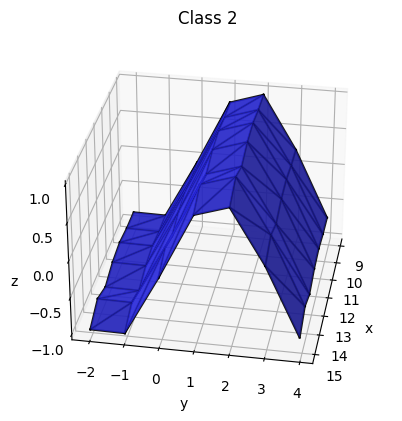

In [94]:
k = 74
view = (30,60)
surface = surfaces_list[k]
#color = vis.value2color_all(cochain1[k], min_val, max_val)
color = vis.value2color_all(representation[k,0], min_val, max_val)
plot_surface_integral(surface, color, simplices, edges, title = 'Class 1', view = view)
print(np.sum(cochain1[k]))
plt.savefig('figures/synthetic-surfaces/surface_cochain'+str(k)+'.pdf')


k = 123 
view = (30,10)
surface = surfaces_list[k]
#color = vis.value2color_all(cochain1[k], min_val, max_val)
color = vis.value2color_all(representation[k,0], min_val, max_val)
plot_surface_integral(surface, color, simplices, edges, title = 'Class 2', view = view)
print(np.sum(cochain1[k]))
plt.savefig('figures/synthetic-surfaces/surface_cochain'+str(k)+'.pdf')

/Users/celiahacker/opt/anaconda3/envs/celia/lib/python3.7/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  if __name__ == "__main__":


-5.241513
-5.573464
-5.246992
-------------------
4.8649874
4.850665
4.8208537
4.831794
4.9106994
4.9578905


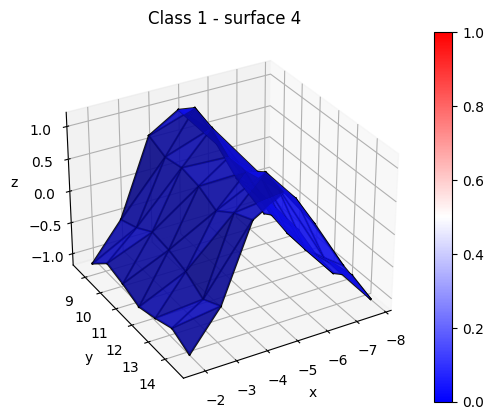

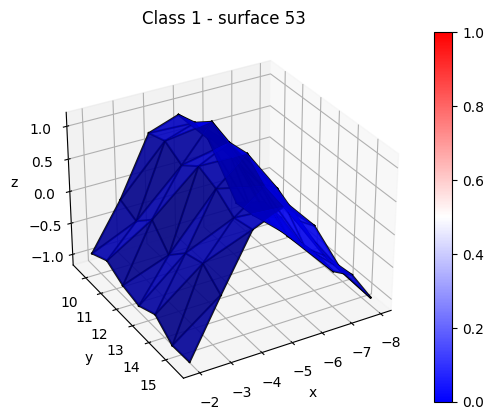

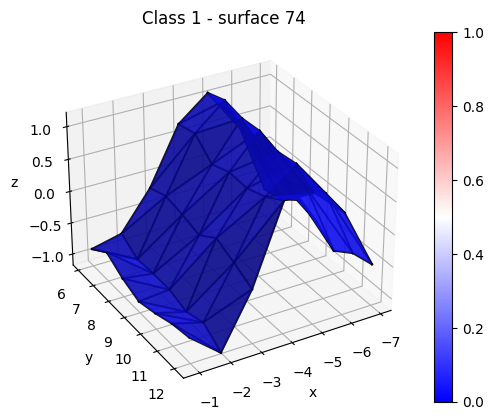

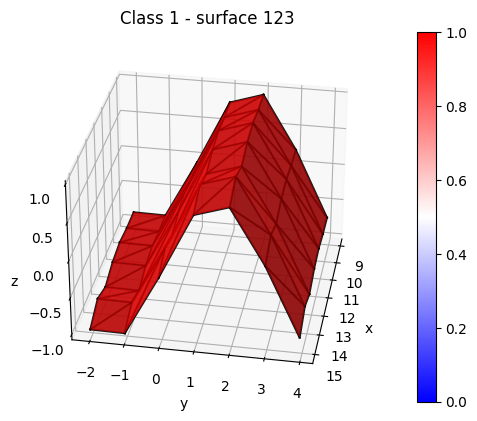

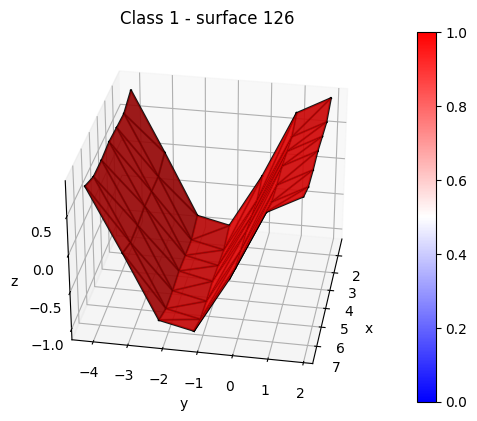

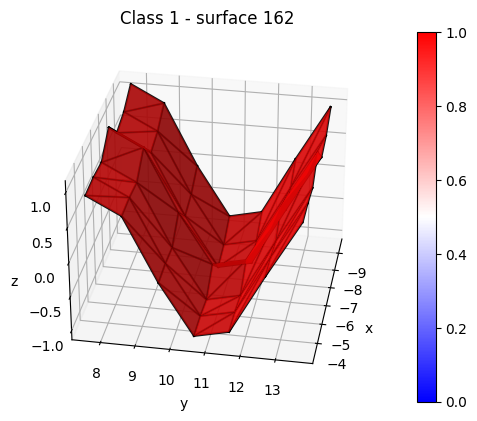

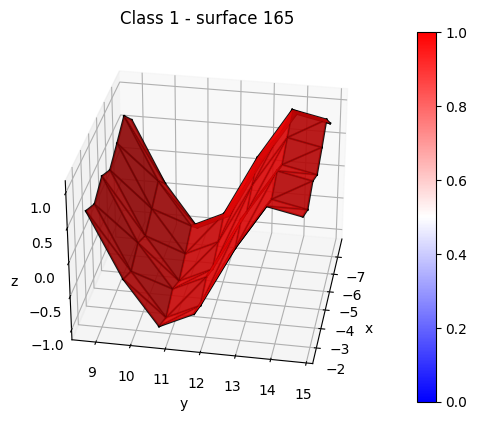

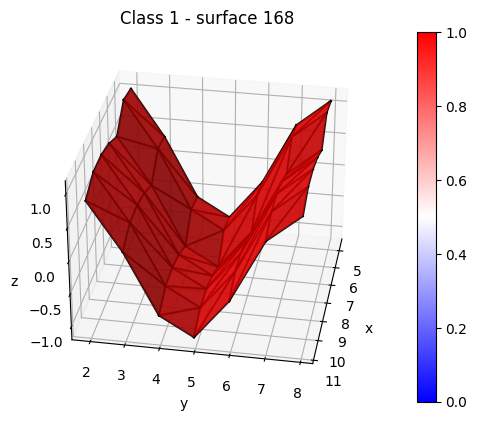

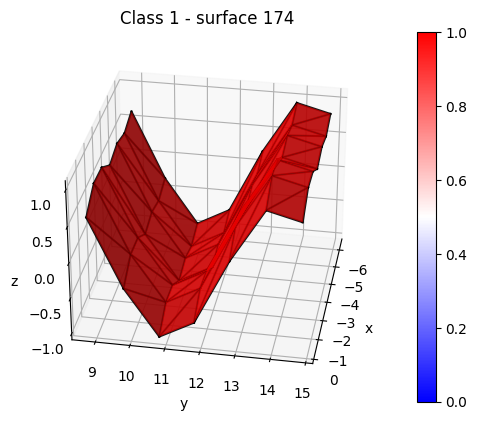

In [91]:
import k_forms_visual as vis
view = (30,60)
min_val = representation[:,1].min()
max_val = representation[:,1].max()

for k in class0cochain1:
    surface = surfaces_list[k]
    #color = vis.value2color_all(cochain1[k], min_val, max_val)
    color = vis.value2color_all(representation[k,1], min_val, max_val)
    plot_surface_integral(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)
    print(np.sum(cochain1[k]))
    
print('-------------------')    
view = (30,10)
for k in class1cochain1:
    surface = surfaces_list[k]
    #color = vis.value2color_all(cochain1[k], min_val, max_val)
    color = vis.value2color_all(representation[k,1], min_val, max_val)
    plot_surface_integral(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)
    print(np.sum(cochain1[k]))
    

/Users/celiahacker/opt/anaconda3/envs/celia/lib/python3.7/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  if __name__ == "__main__":


5.268222332000732
5.547150611877441
5.9061689376831055
5.364642143249512
5.5500288009643555
5.507425785064697
5.50711727142334
-------------------
-4.935204982757568
-4.805718421936035


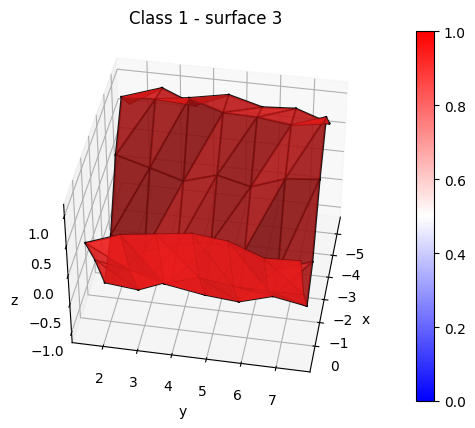

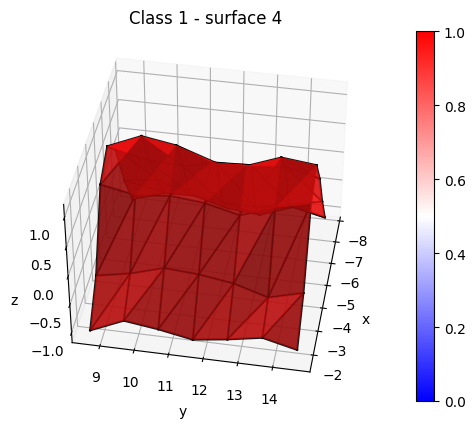

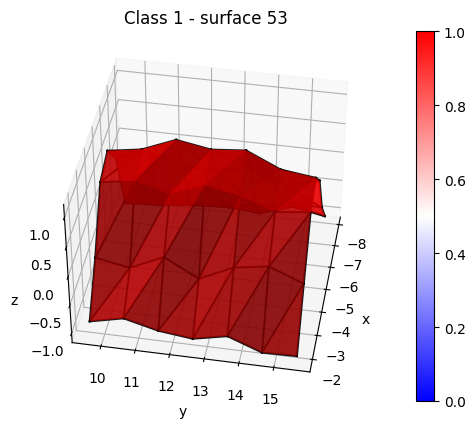

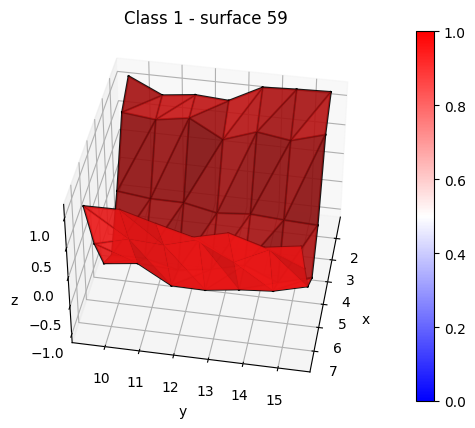

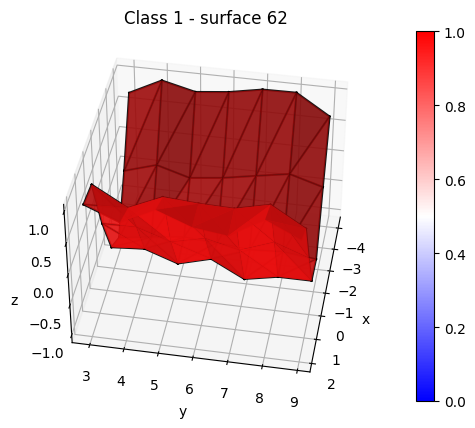

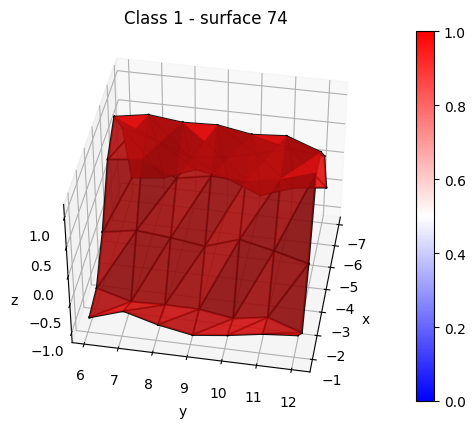

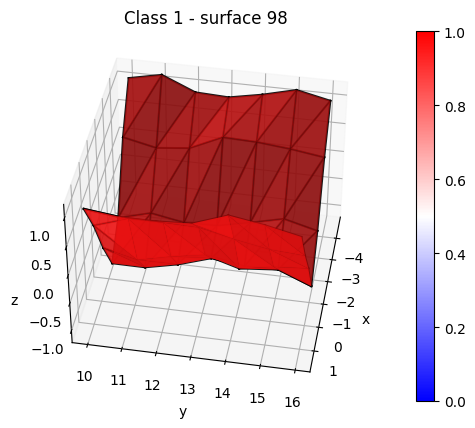

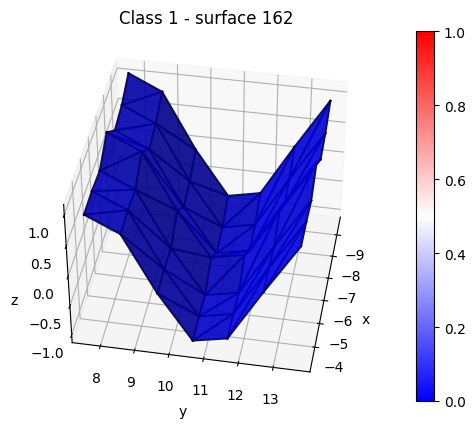

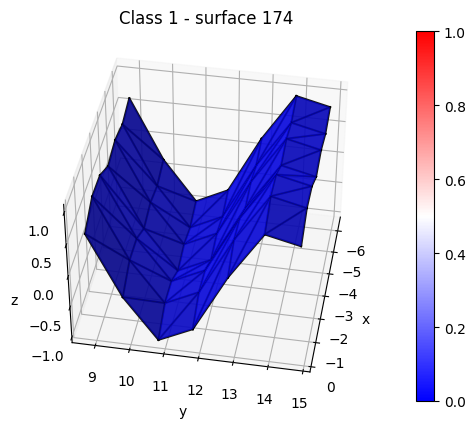

In [87]:
import k_forms_visual as vis
view = (40,10)
min_val = representation[:,0].min()
max_val = representation[:,0].max()

for k in class0cochain0:
    surface = surfaces_list[k]
    #color = vis.value2color_all(cochain1[k], min_val, max_val)
    color = vis.value2color_all(representation[k,0], min_val, max_val)
    plot_surface_integral(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)
    print(representation[k,0])
    
print('-------------------')    

for k in class1cochain0:
    surface = surfaces_list[k]
    #color = vis.value2color_all(cochain1[k], min_val, max_val)
    color = vis.value2color_all(representation[k,0], min_val, max_val)
    plot_surface_integral(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)
    print(representation[k,0])

*****************************************************************

# OLD PLOTS 

*****************************************************************

In [322]:
cochain0 = [cochains[i][:,0] for i in range(len(cochains))]
cochain1 = [cochains[i][:,1] for i in range(len(cochains))]

cochain_flat = [cochains[i].flatten() for i in range(len(cochains))]
cochain_sum = [cochain0[i]+cochain1[i] for i in range(len(cochain0))]

In [323]:
def plot_pca_kform(cochains, labels, n_components, view = None): 

    if n_components == 2: 
        pca = PCA(n_components=2)
        principalComponents = pca.fit_transform(cochains)
        principalDf = pd.DataFrame(data = principalComponents
                    , columns = ['principal component 1', 'principal component 2'])

        # add the labels to the principal components
        principalDf['labels'] = labels
        # plot the principal components
        fig, ax = plt.subplots()
        scatter = ax.scatter(principalDf['principal component 1'], principalDf['principal component 2'], c=principalDf['labels'])
        ax.set_title('PCA of the cochains')
        ax.set_xlabel('Principal Component 1')
        ax.set_ylabel('Principal Component 2')
        legend1 = ax.legend(*scatter.legend_elements(), loc="upper left", title="Classes")

        plt.show()


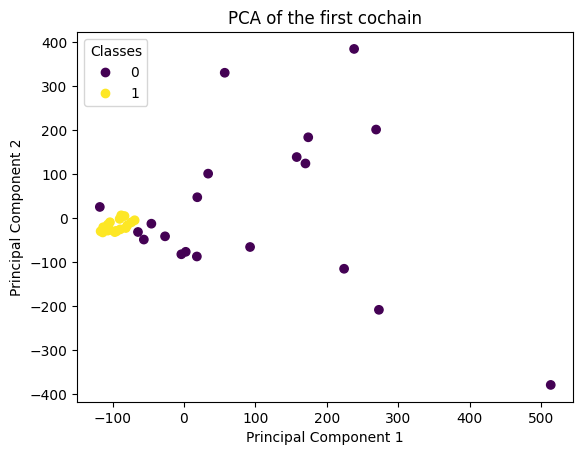

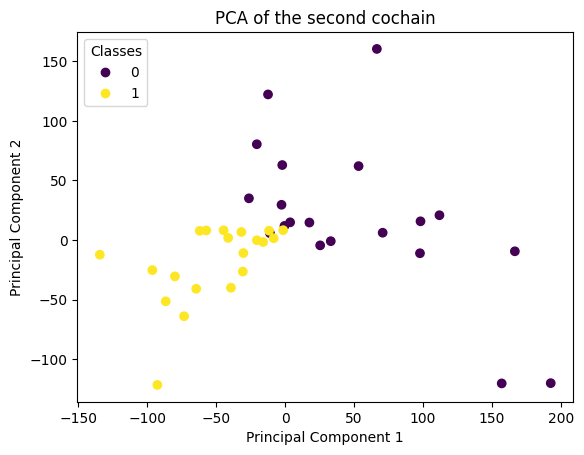

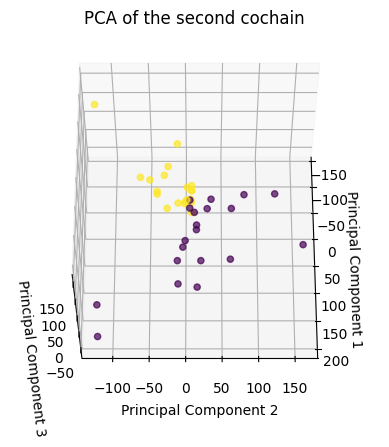

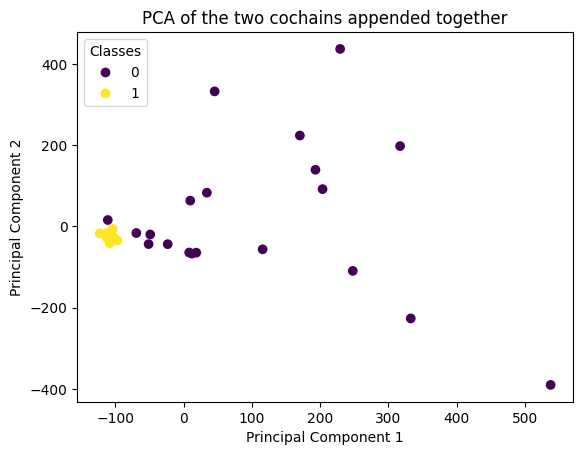

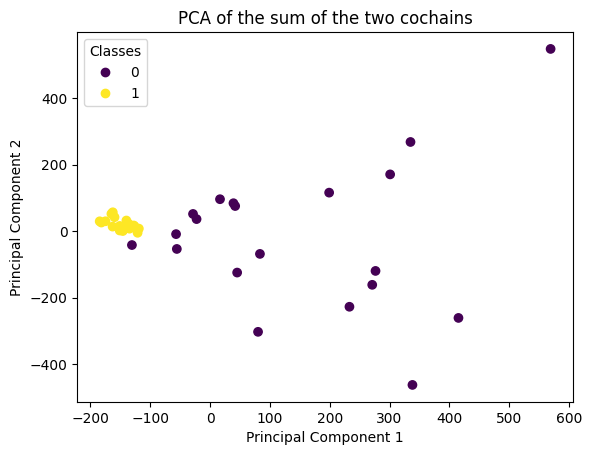

In [324]:
folder =  'figures/synthetic-surfaces'

fig1 = folder+'/pca_kform_cochain1.pdf'
title1 = 'PCA of the first cochain'
vis.plot_pca_kform(cochain0, labels, 2, title = title1, view = None, save = True, save_path = fig1) 

fig2 = folder+'/pca_kform_cochain2.pdf'
title2 = 'PCA of the second cochain'
vis.plot_pca_kform(cochain1, labels, 2, title = title2, save = True, save_path = fig2)

fig3 = folder+'/pca_kform_cochain2_3dim.pdf'
title3 = 'PCA of the second cochain'
vis.plot_pca_kform(cochain1, labels, 3, title= title3, view = (60,0), save = True, save_path = fig3)

fig4 = folder+'/pca_kform_flat.pdf'
title4 = 'PCA of the two cochains appended together'
vis.plot_pca_kform(cochain_flat, labels, 2, title = title4, save = True, save_path = fig4)

fig4 = folder+'/pca_kform_sum.pdf'
title4 = 'PCA of the sum of the two cochains'
vis.plot_pca_kform(cochain_sum, labels, 2, title = title4, save = True, save_path = fig4)


## norms

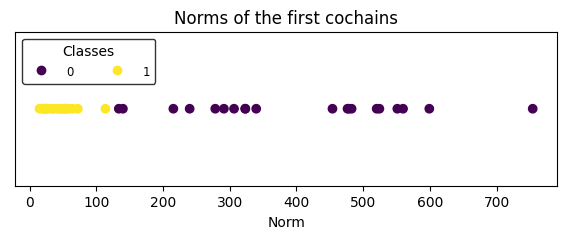

In [325]:
Norms0 = [np.linalg.norm(cochain) for cochain in cochain0]
fig, ax = plt.subplots()
# set figure size
fig.set_size_inches(7, 2)
# remove y axis ticks
ax.set_yticks([])

# ploz laber on x axis
ax.set_xlabel('Norm')
scatter = ax.scatter(Norms0, np.zeros(len(Norms0)), c=labels, cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
# plot labels horizontally
#plt.setp(legend1.get_texts(), horizontalalignment='center')

# reshape the legend box
frame = legend1.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('black')
# set the fontsize
for label in legend1.get_texts():
    label.set_fontsize('small')



ax.set_title('Norms of the first cochains')
plt.show()



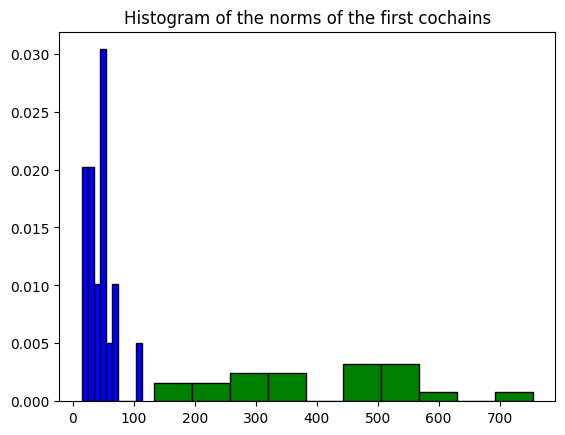

In [326]:
# make a histogram of the norms of the first cochains and color by class
fig, ax = plt.subplots()
ax.hist(Norms0[:20], bins=10, density=True, histtype='bar', color='green', ec='black')
ax.hist(Norms0[20:], bins=10, density=True, histtype='bar', color='blue', ec='black')
ax.set_title("Histogram of the norms of the first cochains")
plt.show()


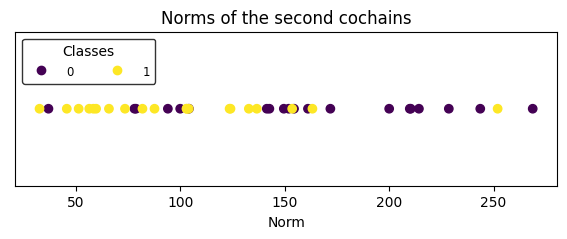

In [327]:
Norms1 = [np.linalg.norm(cochain) for cochain in cochain1]
fig, ax = plt.subplots()
# set figure size
fig.set_size_inches(7, 2)
# remove y axis ticks
ax.set_yticks([])

# ploz laber on x axis
ax.set_xlabel('Norm')
scatter = ax.scatter(Norms1, np.zeros(len(Norms1)), c=labels, cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
# plot labels horizontally
#plt.setp(legend1.get_texts(), horizontalalignment='center')

# reshape the legend box
frame = legend1.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('black')
# set the fontsize
for label in legend1.get_texts():
    label.set_fontsize('small')


ax.set_title('Norms of the second cochains')
plt.show()


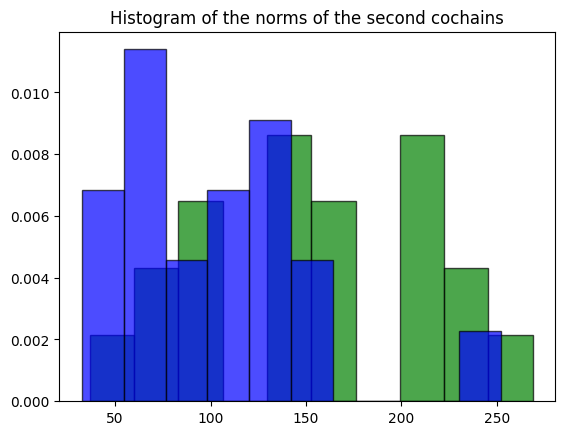

In [328]:
# make a histogram of the norms of the first cochains and color by class
fig, ax = plt.subplots()
ax.hist(Norms1[:20], bins=10, density=True, histtype='bar', color='green', ec='black', alpha = 0.7)
ax.hist(Norms1[20:], bins=10, density=True, histtype='bar', color='blue', ec='black', alpha = 0.7)
ax.set_title("Histogram of the norms of the second cochains")
plt.show()


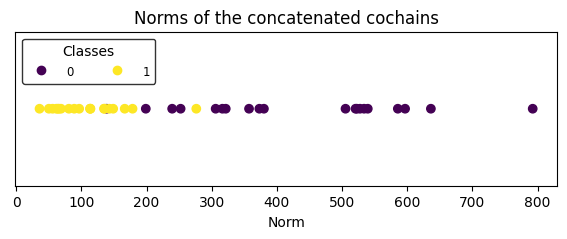

In [329]:
Norms_flat = [np.linalg.norm(cochain) for cochain in cochain_flat]

fig, ax = plt.subplots()
# set figure size
fig.set_size_inches(7, 2)
# remove y axis ticks
ax.set_yticks([])

# ploz laber on x axis
ax.set_xlabel('Norm')
scatter = ax.scatter(Norms_flat, np.zeros(len(Norms_flat)), c=labels, cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
# plot labels horizontally
#plt.setp(legend1.get_texts(), horizontalalignment='center')

# reshape the legend box
frame = legend1.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('black')
# set the fontsize
for label in legend1.get_texts():
    label.set_fontsize('small')


ax.set_title('Norms of the concatenated cochains')
plt.show()

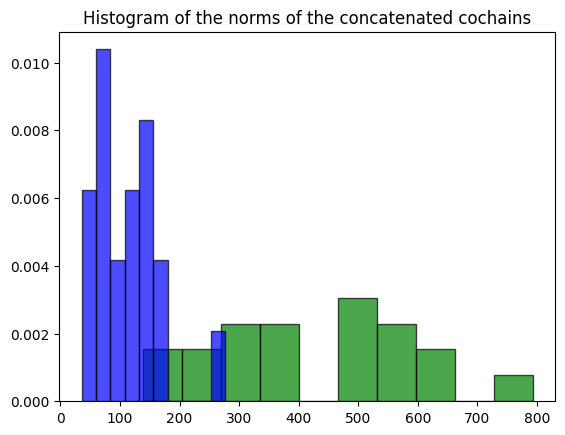

In [330]:
# make a histogram of the norms of the first cochains and color by class
fig, ax = plt.subplots()
ax.hist(Norms_flat[:20], bins=10, density=True, histtype='bar', color='green', ec='black', alpha = 0.7)
ax.hist(Norms_flat[20:], bins=10, density=True, histtype='bar', color='blue', ec='black', alpha = 0.7)
ax.set_title("Histogram of the norms of the concatenated cochains")
plt.show()


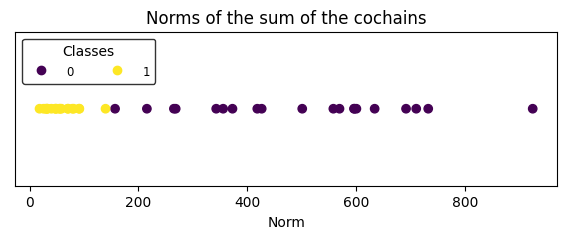

In [331]:
cochain_sum = [cochain0[i]+cochain1[i] for i in range(len(cochain0))]

Norms_sum = [np.linalg.norm(cochain) for cochain in cochain_sum]


fig, ax = plt.subplots()
# set figure size
fig.set_size_inches(7, 2)
# remove y axis ticks
ax.set_yticks([])

# ploz laber on x axis
ax.set_xlabel('Norm')
scatter = ax.scatter(Norms_sum, np.zeros(len(Norms_sum)), c=labels, cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
# plot labels horizontally
#plt.setp(legend1.get_texts(), horizontalalignment='center')

# reshape the legend box
frame = legend1.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('black')
# set the fontsize
for label in legend1.get_texts():
    label.set_fontsize('small')


ax.set_title('Norms of the sum of the cochains')
plt.show()



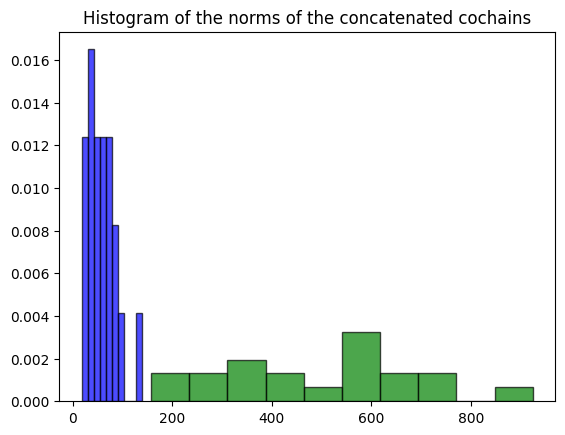

In [332]:
# make a histogram of the norms of the first cochains and color by class
fig, ax = plt.subplots()
ax.hist(Norms_sum[:20], bins=10, density=True, histtype='bar', color='green', ec='black', alpha = 0.7)
ax.hist(Norms_sum[20:], bins=10, density=True, histtype='bar', color='blue', ec='black', alpha = 0.7)
ax.set_title("Histogram of the norms of the concatenated cochains")
plt.savefig('figures/synthetic-surfaces/histogram_norms_concatenated.pdf')
plt.show()


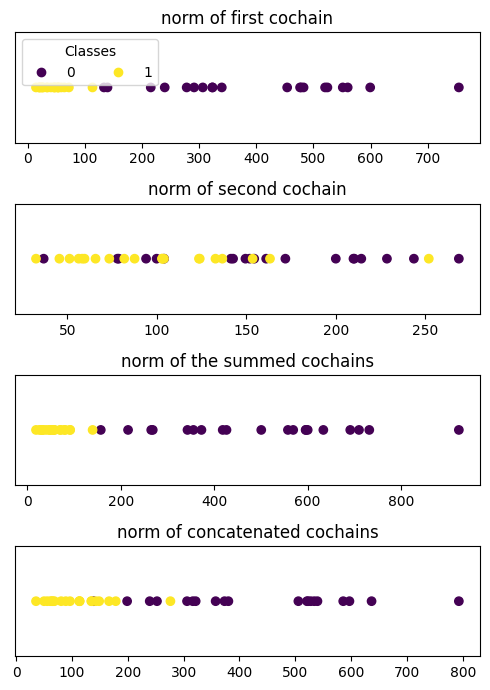

In [333]:
# figure with 4 subplots

fig, axs = plt.subplots(4,1, figsize=(5, 7))

scatter = axs[0].scatter(Norms0, np.zeros(len(Norms0)), c=labels, cmap='viridis')
legend1 = axs[0].legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
axs[0].set_yticks([])
axs[0].set_title('norm of first cochain')

scatter = axs[1].scatter(Norms1, np.zeros(len(Norms0)), c=labels, cmap='viridis')
#legend1 = axs[1].legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
axs[1].set_yticks([])
axs[1].set_title('norm of second cochain')

scatter = axs[2].scatter(Norms_sum, np.zeros(len(Norms0)), c=labels, cmap='viridis')
#legend1 = axs[1].legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
axs[2].set_yticks([])
axs[2].set_title('norm of the summed cochains')

scatter = axs[3].scatter(Norms_flat, np.zeros(len(Norms0)), c=labels, cmap='viridis')
#legend1 = axs[1].legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
axs[3].set_yticks([])
axs[3].set_title('norm of concatenated cochains')
fig.tight_layout()
plt.show()



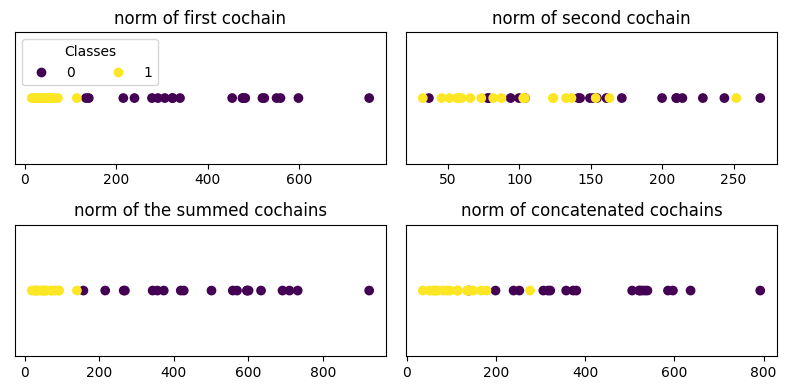

In [334]:
# figure with 4 subplots

fig, axs = plt.subplots(2,2, figsize=(8, 4))

scatter = axs[0,0].scatter(Norms0, np.zeros(len(Norms0)), c=labels, cmap='viridis')
legend1 = axs[0,0].legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
axs[0,0].set_yticks([])
axs[0,0].set_title('norm of first cochain')

scatter = axs[0,1].scatter(Norms1, np.zeros(len(Norms0)), c=labels, cmap='viridis')
#legend1 = axs[1].legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
axs[0,1].set_yticks([])
axs[0,1].set_title('norm of second cochain')

scatter = axs[1,0].scatter(Norms_sum, np.zeros(len(Norms0)), c=labels, cmap='viridis')
#legend1 = axs[1].legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
axs[1,0].set_yticks([])
axs[1,0].set_title('norm of the summed cochains')

scatter = axs[1,1].scatter(Norms_flat, np.zeros(len(Norms0)), c=labels, cmap='viridis')
#legend1 = axs[1].legend(*scatter.legend_elements(), loc="upper left", ncol = 2, title="Classes")
axs[1,1].set_yticks([])
axs[1,1].set_title('norm of concatenated cochains')
fig.tight_layout()

plt.savefig('figures/synthetic-surfaces/norms.pdf')

plt.show()

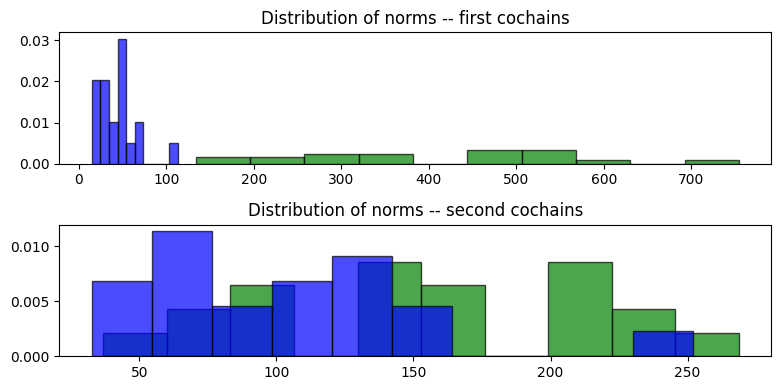

In [335]:
# historgams in two suplots

fig, axs = plt.subplots(2,1, figsize=(8, 4))

axs[0].hist(Norms0[:20], bins=10, density=True, histtype='bar', color='green', ec='black', alpha = 0.7)
axs[0].hist(Norms0[20:], bins=10, density=True, histtype='bar', color='blue', ec='black', alpha = 0.7)
axs[0].set_title("Distribution of norms -- first cochains")


axs[1].hist(Norms1[:20], bins=10, density=True, histtype='bar', color='green', ec='black', alpha = 0.7)
axs[1].hist(Norms1[20:], bins=10, density=True, histtype='bar', color='blue', ec='black', alpha = 0.7)
axs[1].set_title("Distribution of norms -- second cochains")

fig.tight_layout()
plt.savefig('figures/synthetic-surfaces/norms_hist.pdf')
plt.show()




## summed representation of the surfaces

In [336]:
representation = np.zeros((40, 2))
for i in range(40):
    representation[i,0] = np.sum(cochain0[i])
    representation[i,1] = np.sum(cochain1[i])


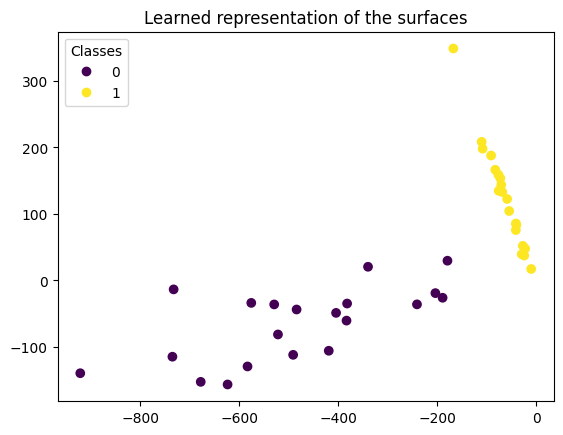

In [337]:

representation = np.zeros((40, 2))
for i in range(40):
    representation[i,0] = np.sum(cochain0[i])
    representation[i,1] = np.sum(cochain1[i])

# plot the representation

fig, ax = plt.subplots()
scatter = ax.scatter(representation[:,0], representation[:,1], c=labels)

# plot legend
legend1 = ax.legend(*scatter.legend_elements(), loc="upper left", title="Classes")


ax.set_title('Learned representation of the surfaces')
plt.savefig('figures/synthetic-surfaces/learned_representation.pdf')
plt.show()

## visualizing the cochains 


/Users/celiahacker/opt/anaconda3/envs/celia/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  # This is added back by InteractiveShellApp.init_path()


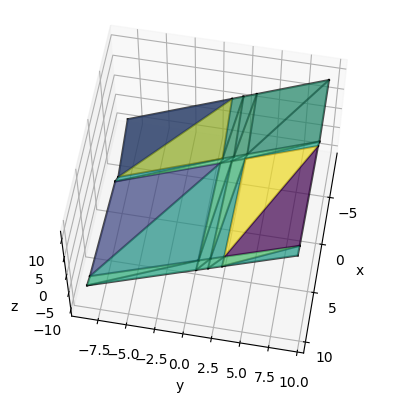

In [338]:
surface = surfaces_list[10]
color = vis.value2color(cochains[10][:,0])


sx = surface['points'][:,0].reshape(5,5)
sy = surface['points'][:,1].reshape(5,5)
sz = surface['points'][:,2].reshape(5,5)

# plot the surface
fig = plt.figure()
ax = fig.gca(projection='3d')

#ax.plot_surface(sx, sy, sz, cmap='Greys', edgecolor=None, alpha = 0.7)

for e in edges: 
    pts = surface['points'][e]
    pt1 = np.array(pts[0])
    pt2 = np.array(pts[1])
    # plot the edge from the points
    ax.plot([pt1[0], pt2[0]], [pt1[1], pt2[1]], [pt1[2], pt2[2]], 'k', alpha = 0.7)

simplex = simplices[0]
pts = surface['points'][simplex]
x = pts[:,0]
y = pts[:,1]
z = pts[:,2]

tri = mtri.Triangulation(x, y)
ax.plot_trisurf(x, y, z, triangles=tri.triangles, color =list(color[0])[:3], alpha = 0.5)


for i in range(len(simplices)): 
    simplex = simplices[i]
    pts = surface['points'][simplex]
    x = pts[:,0]
    y = pts[:,1]
    z = pts[:,2]

    tri = mtri.Triangulation(x, y)
    ax.plot_trisurf(x, y, z, triangles=tri.triangles, color =list(color[i])[:3], alpha = 0.7)

# set axis labels
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')


#ax.set_title('Surface plot')
ax.view_init(60,10)



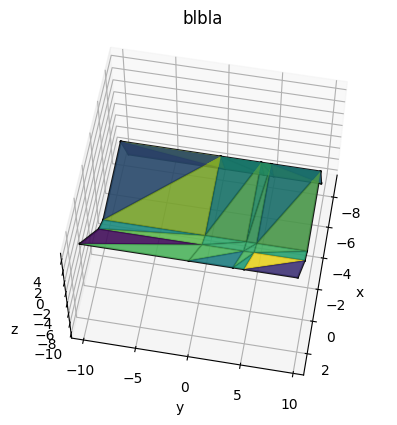

In [339]:
k = 39
surface = surfaces_list[k]
color = vis.value2color(cochains[k][:,0])
vis.plot_surface_cochain(surface, color, simplices, edges, title = 'blbla')
plt.savefig('figures/synthetic-surfaces/surface_cochain.pdf')

In [340]:
cochain_np= np.array(cochain0)
print(cochain_np.shape)
cochain_np = cochain_np.flatten()
print(cochain_np.shape)
min_val = cochain_np.min()
max_val = cochain_np.max()

(40, 32)
(1280,)


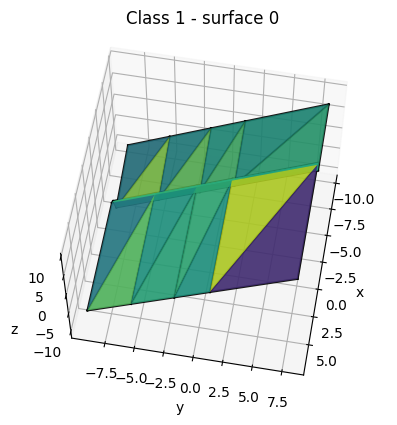

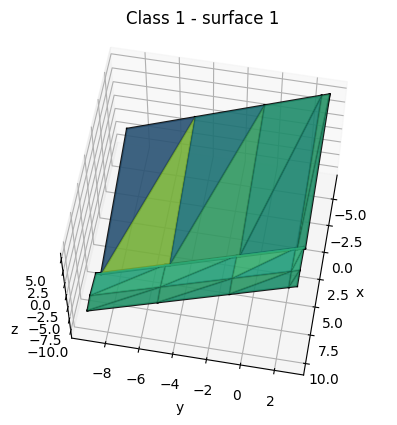

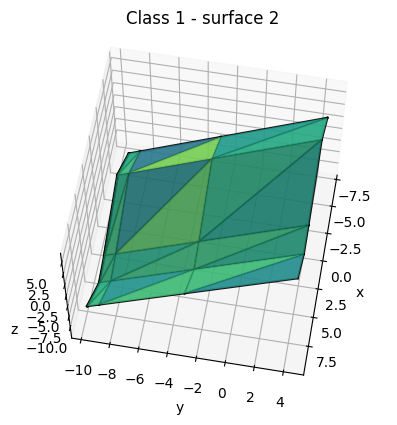

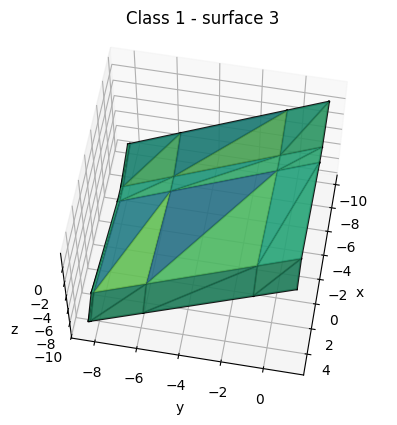

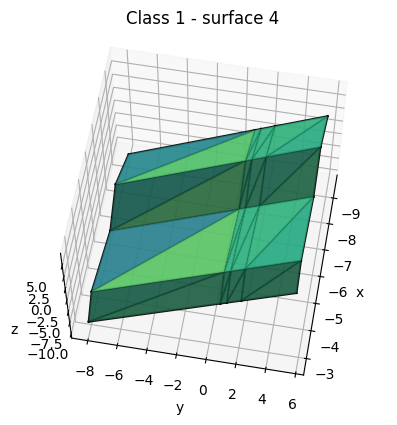

...

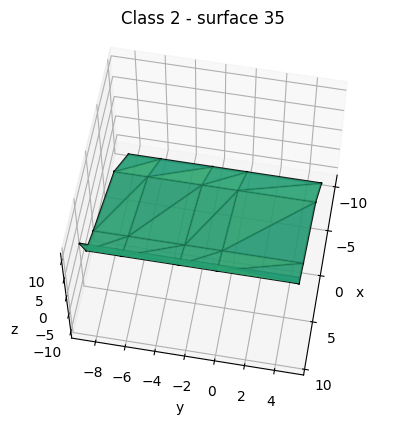

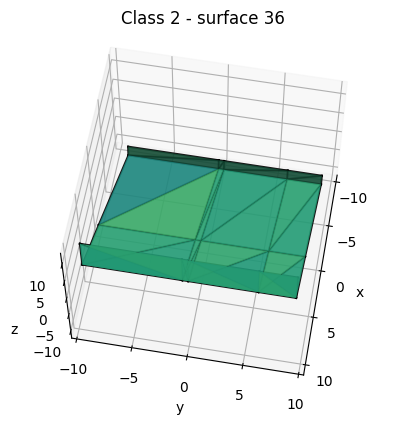

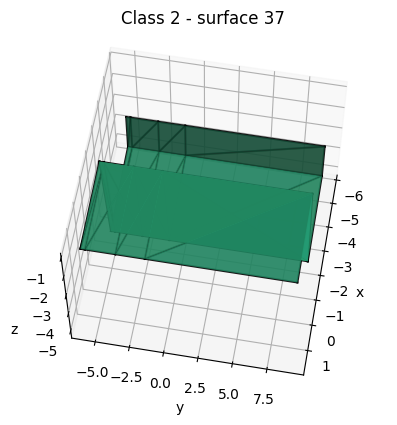

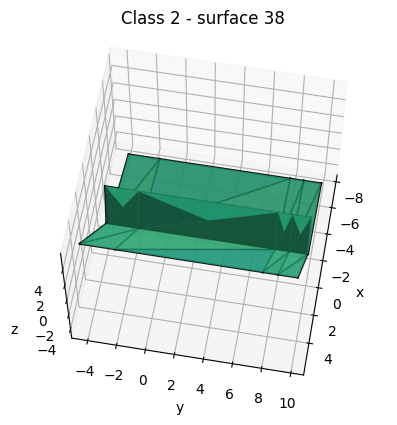

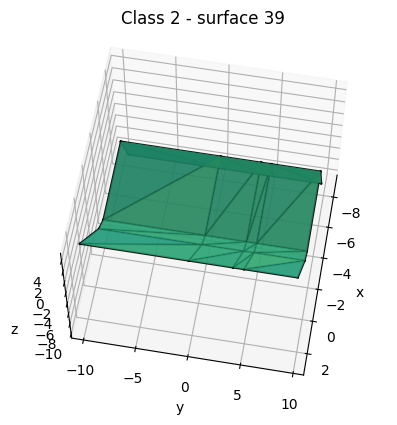

In [369]:
cochain_np= np.array(cochain0)
cochain_np = cochain_np.flatten()
min_val = cochain_np.min()
max_val = cochain_np.max()

view = (60,10)
for k in range(20): 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain0[k], min_val, max_val)
    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)


for k in range(20,40): 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain0[k], min_val, max_val)

    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 2 - surface '+str(k), view = view)
    #plt.savefig('figures/synthetic-surfaces/surface_cochain'+str(k)+'.pdf')

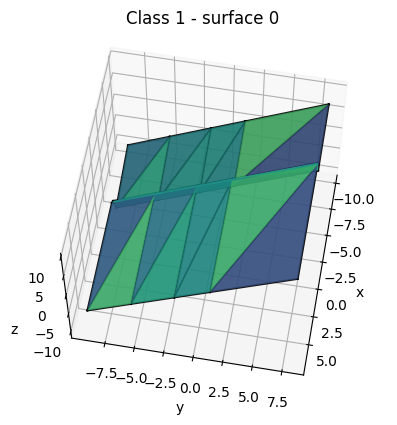

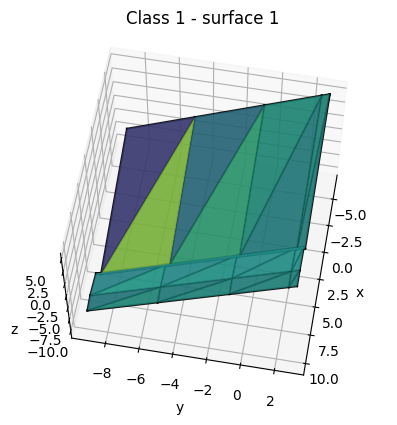

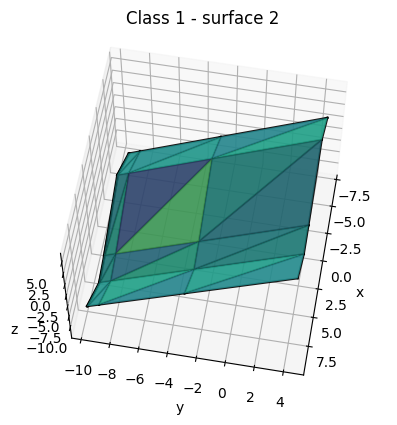

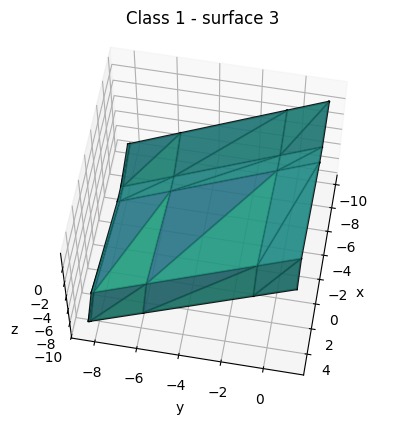

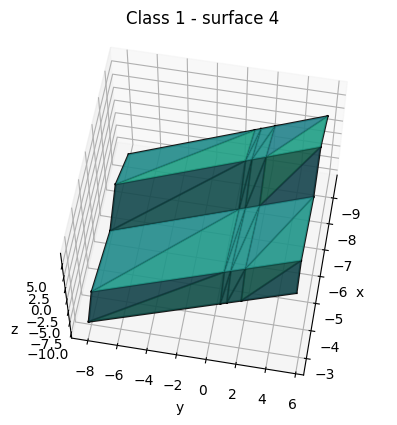

...

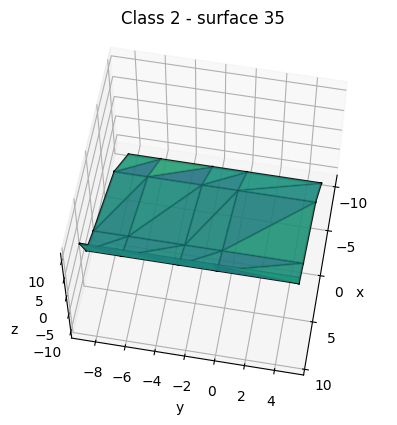

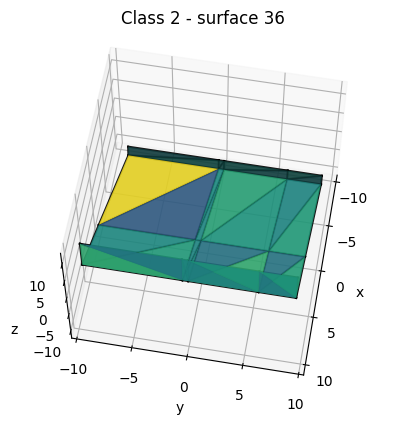

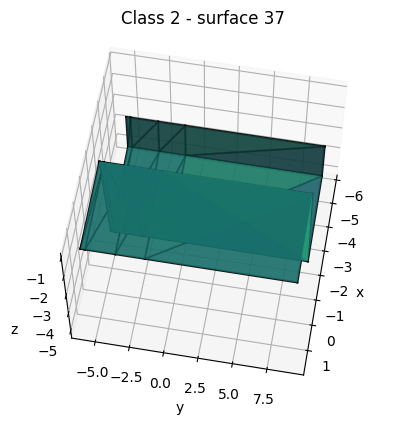

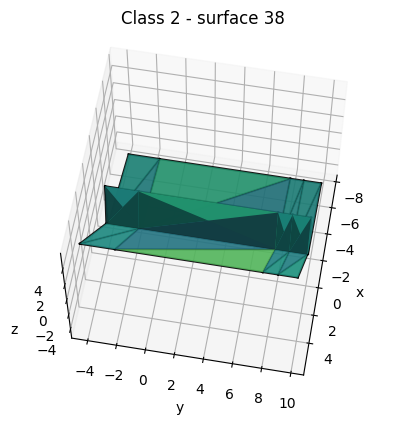

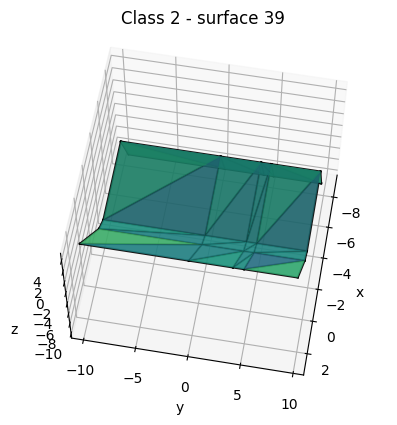

In [368]:
cochain_np= np.array(cochain1)
cochain_np = cochain_np.flatten()
min_val = cochain_np.min()
max_val = cochain_np.max()

view = (60,10)
for k in range(20): 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain1[k], min_val, max_val)
    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)


for k in range(20,40): 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain1[k], min_val, max_val)

    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 2 - surface '+str(k), view = view)
    #plt.savefig('figures/synthetic-surfaces/surface_cochain'+str(k)+'.pdf')

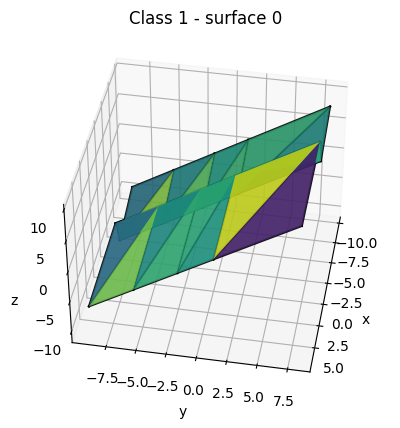

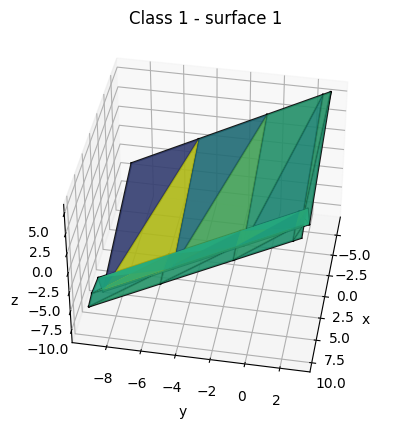

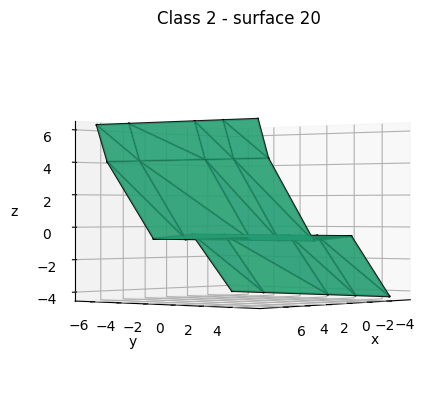

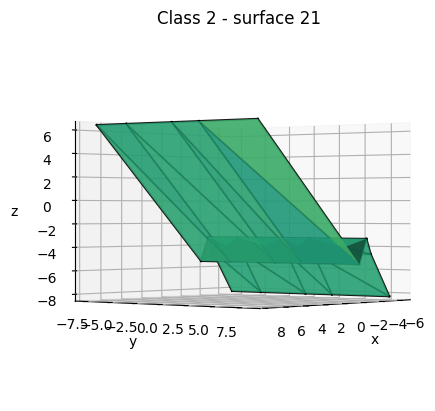

In [367]:
cochain_np= np.array(cochain_sum)
cochain_np = cochain_np.flatten()
min_val = cochain_np.min()
max_val = cochain_np.max()


view = (40,10)
for k in range(2): 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain_sum[k], min_val, max_val)
    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)


view = (0,40)
for k in range(20,22): 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain_sum[k], min_val, max_val)

    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 2 - surface '+str(k), view = view)
    #plt.savefig('figures/synthetic-surfaces/surface_cochain'+str(k)+'.pdf')

/Users/celiahacker/cochain_representation_learning/k_forms_visual.py:202: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  ax = fig.gca(projection='3d')


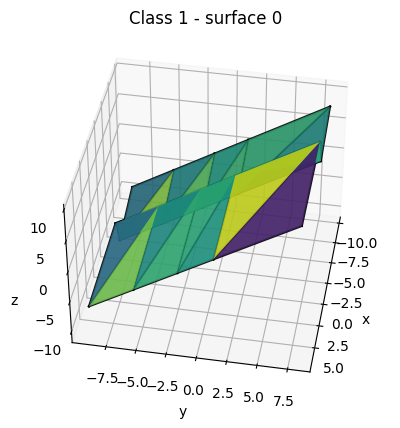

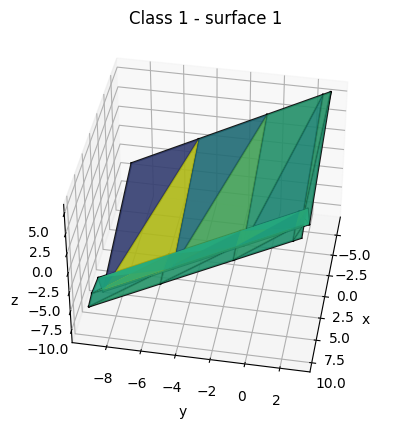

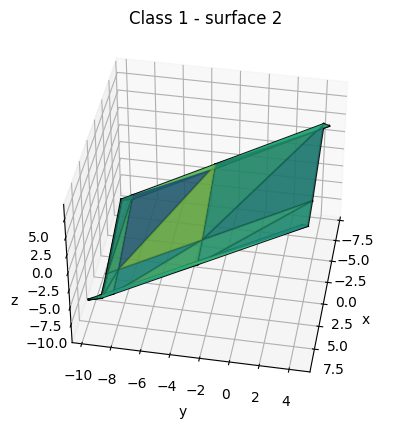

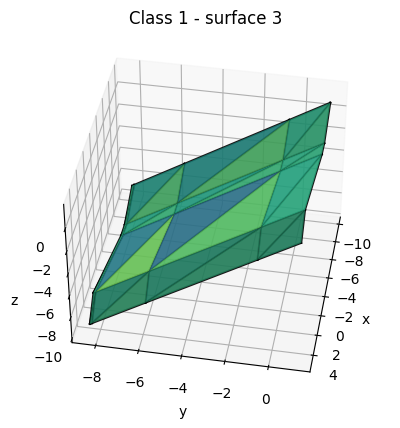

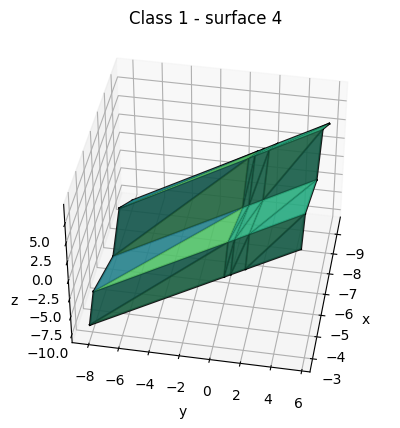

...

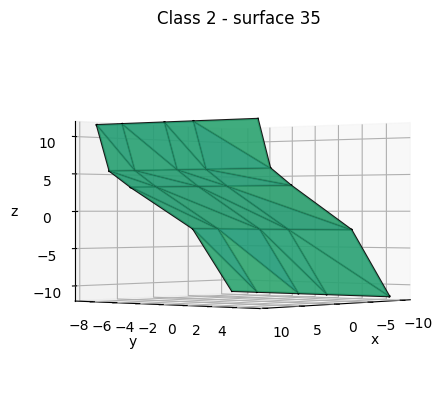

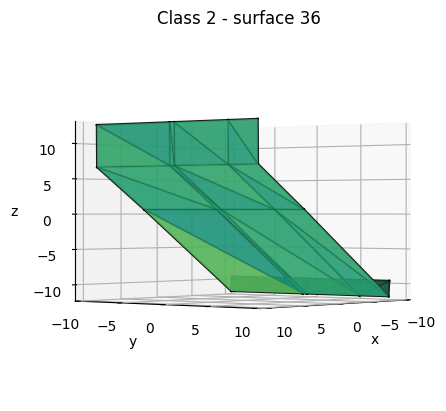

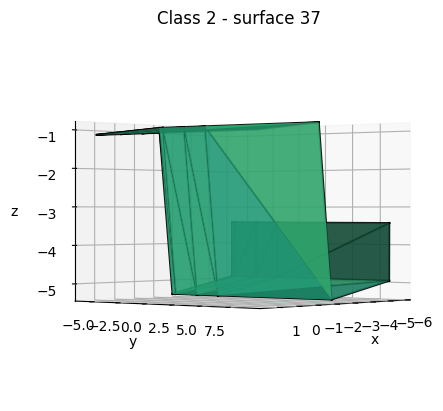

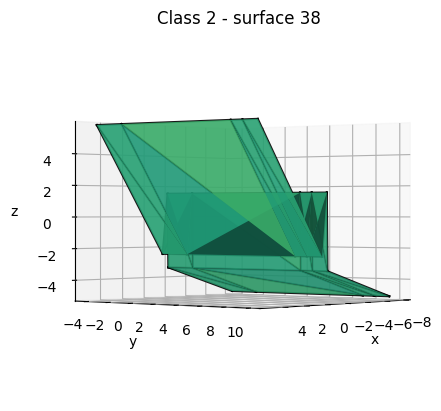

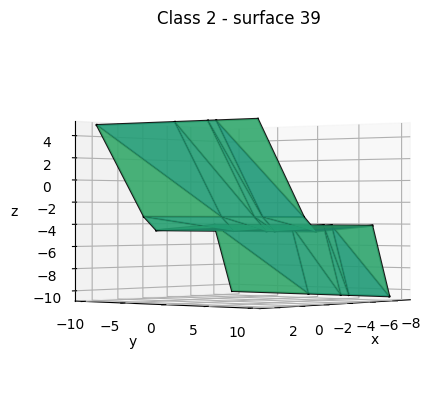

In [365]:
cochain_np= np.array(cochain_sum)
cochain_np = cochain_np.flatten()
min_val = cochain_np.min()
max_val = cochain_np.max()


view = (40,10)
for k in range(20): 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain_sum[k], min_val, max_val)
    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 1 - surface '+str(k), view = view)


view = (0,40)
for k in range(20,40): 
    surface = surfaces_list[k]
    color = vis.value2color_all(cochain_sum[k], min_val, max_val)

    vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 2 - surface '+str(k), view = view)
    #plt.savefig('figures/synthetic-surfaces/surface_cochain'+str(k)+'.pdf')

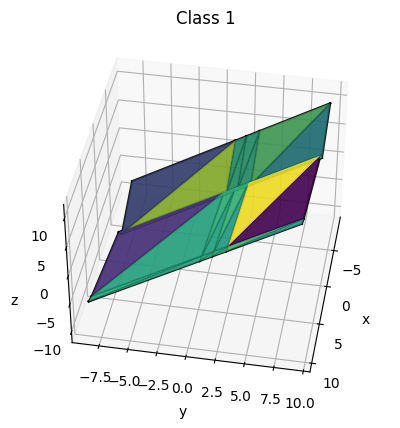

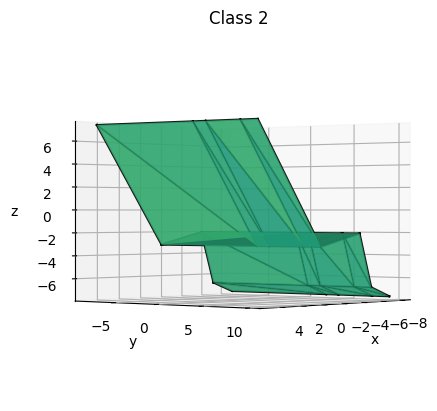

In [371]:
cochain_np= np.array(cochain_sum)
cochain_np = cochain_np.flatten()
min_val = cochain_np.min()
max_val = cochain_np.max()


view = (40,10)
k = 10 
surface = surfaces_list[k]
color = vis.value2color_all(cochain_sum[k], min_val, max_val)
vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 1', view = view)
plt.savefig('figures/synthetic-surfaces/surface_summed_cochain'+str(k)+'.pdf')


view = (0,40)
k = 27
surface = surfaces_list[k]
color = vis.value2color_all(cochain_sum[k], min_val, max_val)

vis.plot_surface_cochain(surface, color, simplices, edges, title = 'Class 2', view = view)
plt.savefig('figures/synthetic-surfaces/surface_summed_cochain'+str(k)+'.pdf')

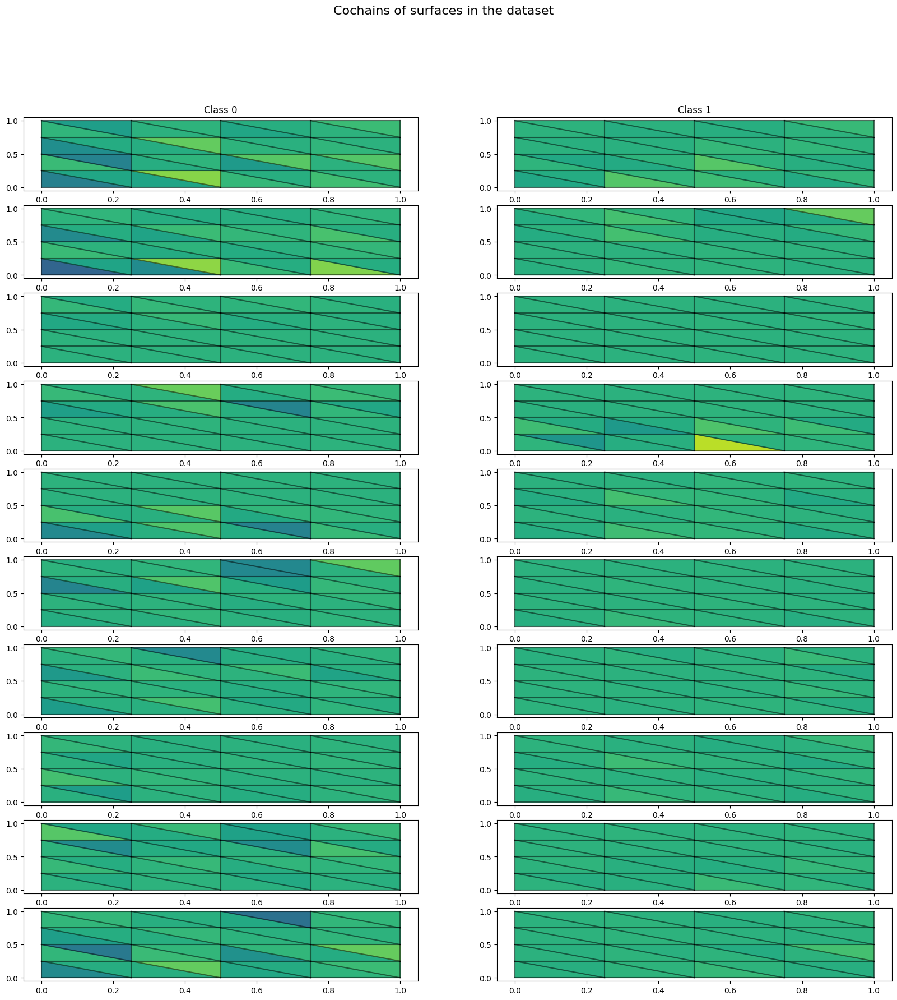

In [360]:

vis.plot_comparison_cochains(cochain_flat, points, simplices, ac, 10)

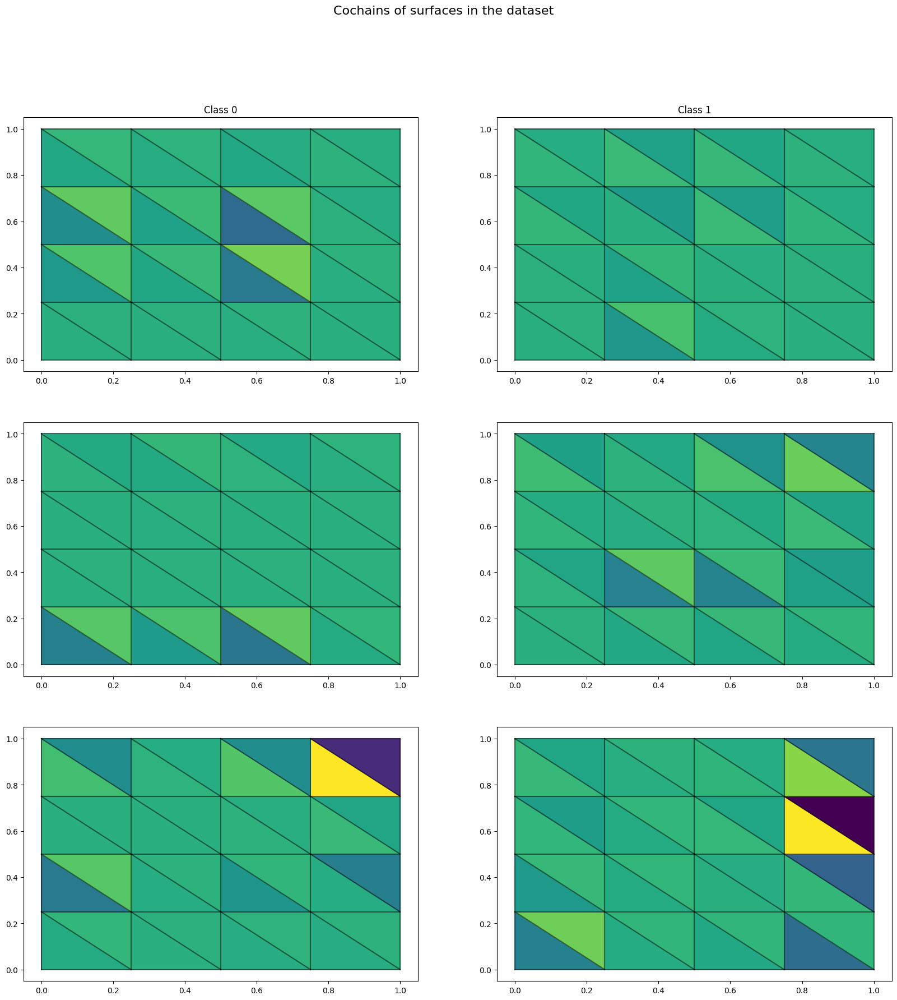

In [16]:
vis.plot_comparison_cochains_indices(cochain0, points, simplices, ac, [3,4,5], [7,8,9])

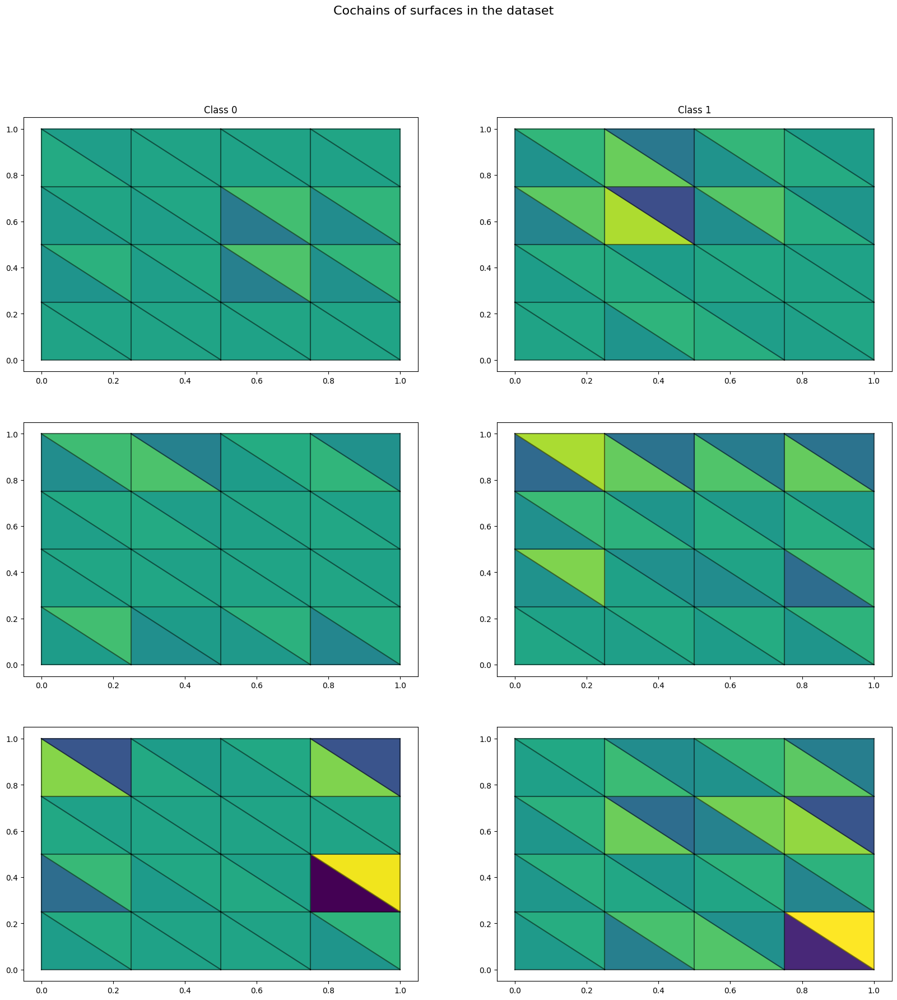

In [17]:
vis.plot_comparison_cochains_indices(cochain1, points, simplices, ac, [3,4,5], [7,8,9])

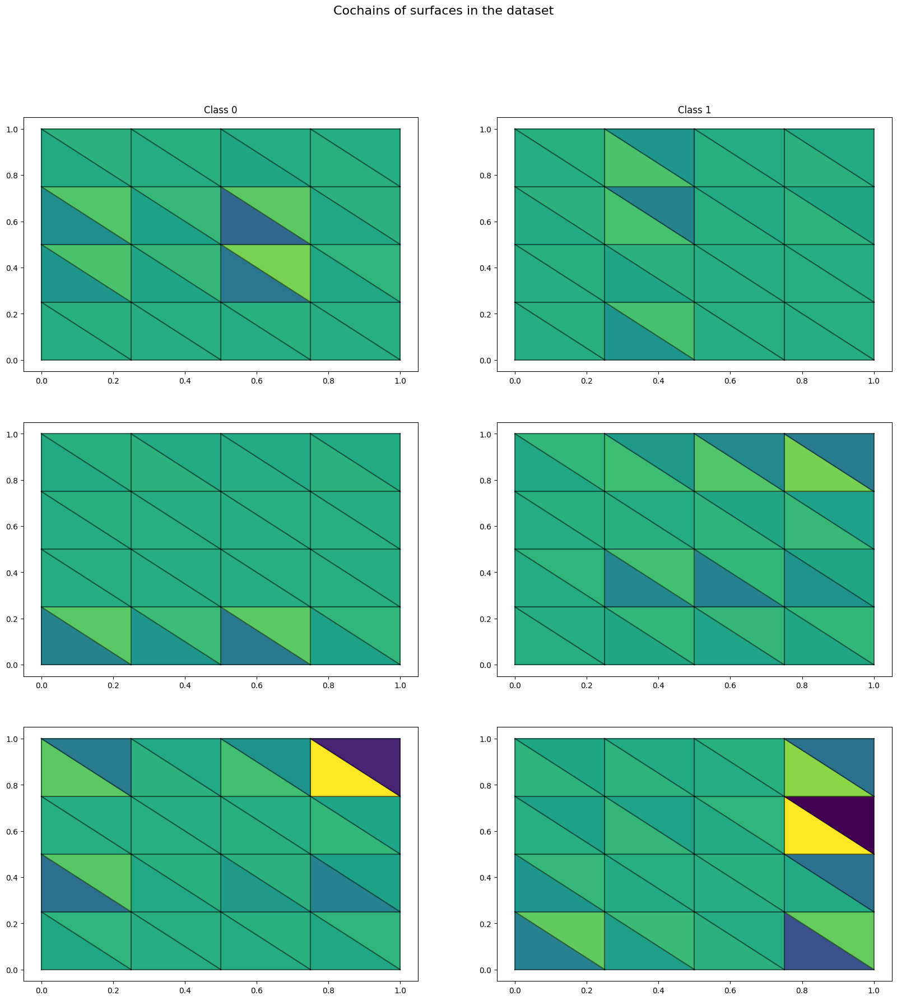

In [18]:
vis.plot_comparison_cochains_indices(cochain_sum, points, simplices, ac, [3,4,5], [7,8,9])

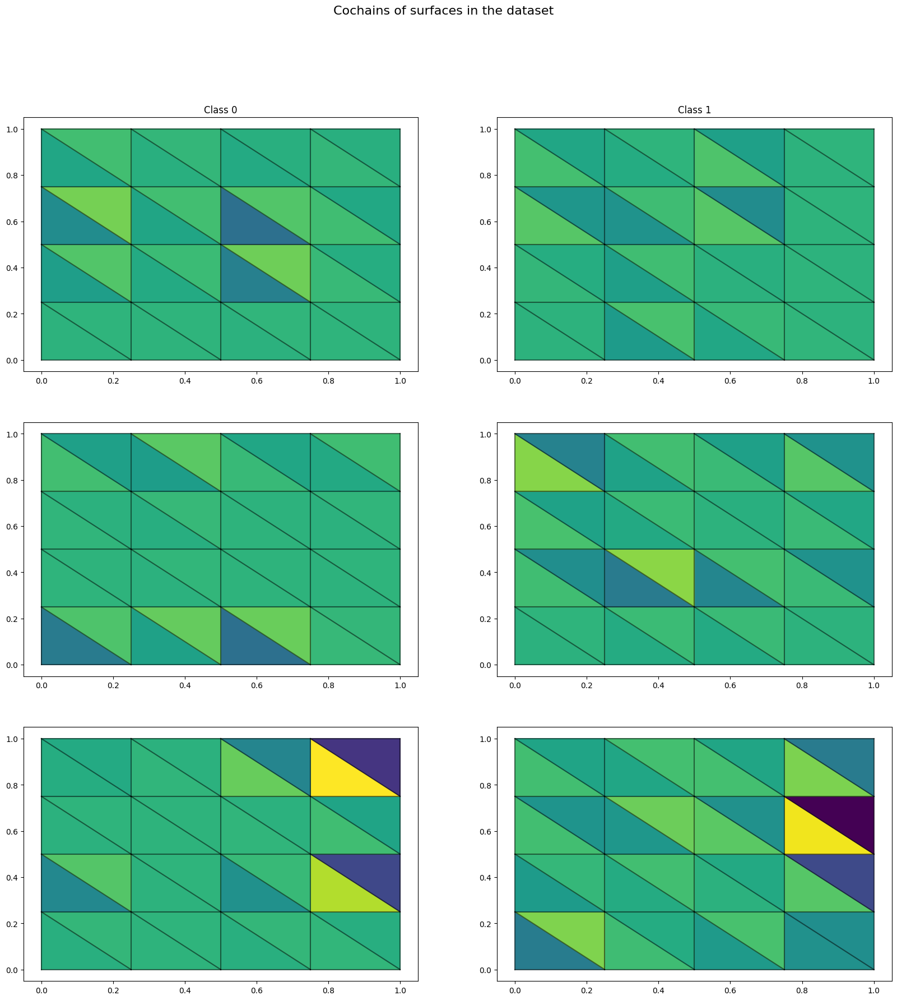

In [19]:
cochain_dif = [cochain0[i]-cochain1[i] for i in range(len(cochain0))]
vis.plot_comparison_cochains_indices(cochain_dif, points, simplices, ac, [3,4,5], [7,8,9])


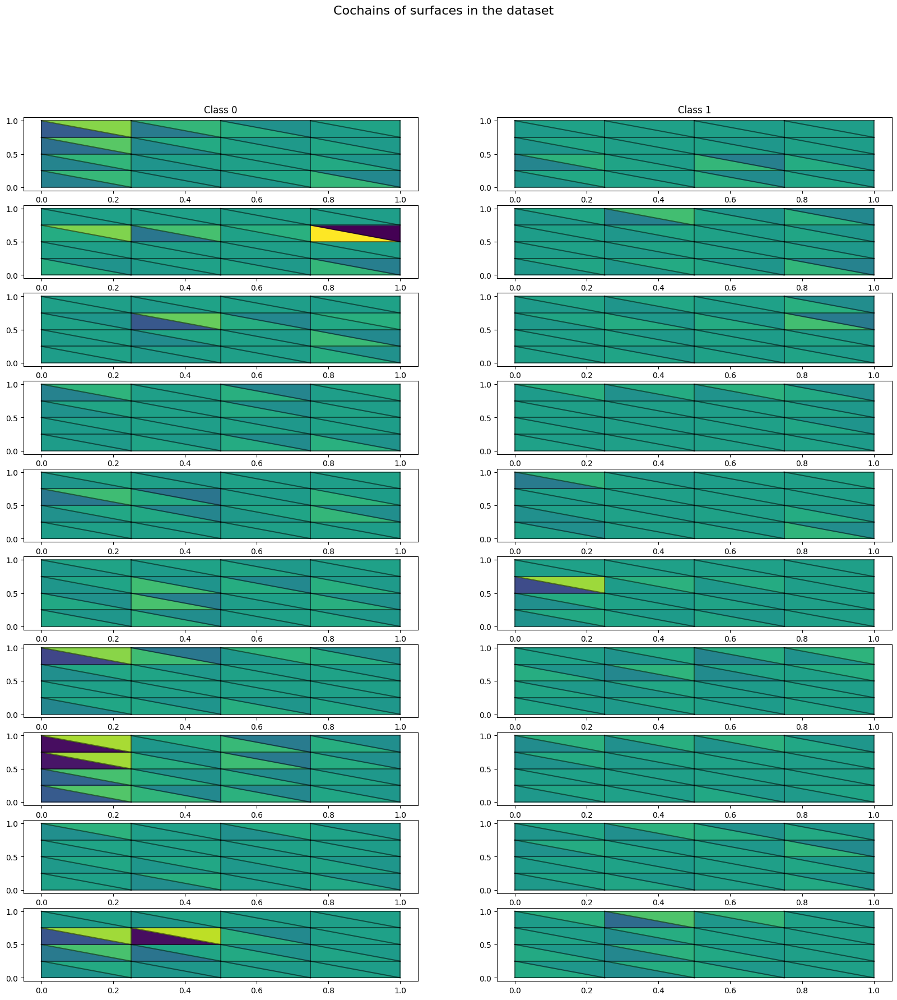

In [26]:
vis.plot_comparison_cochains(cochain_dif, points, simplices, ac, 10)